# Tasks
* Load the data into _R_ or _Python_
  - Notebooks (e.g. Jupyter)  make us smile, but scripts work too.
* Perform exploratory data analysis.
  - Be verbose as to what you are looking at and why.
  - Keep in mind the primary task below.
* Perform data cleaning, if necessary.
  - Again, explain your methodology and  reasoning behind it.
* **Primary Task** - Answer the following questions:  
   - Which single field in `dataset.csv` best describes the `SalePrice` field?
   - Why did you choose this field? Please thoroughly explain your reasoning. 	



### Import the necessary python dependencies


In [1]:
import os, gc, warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import  numpy as np
import pandas as pd
import random
import seaborn as sns
from scipy import stats
from scipy.stats import norm
%matplotlib inline
sns.set_style('whitegrid')

## Inspecting the Dataset  
<font size='2'>  
&nbsp; &nbsp; EDA and data cleaning is the foundation on which a good visualization is built.
</font>
<br>

In [2]:
# Show all data columns
pd.set_option("display.max_column", 100)
#  Load the dataset
df = pd.read_csv('./dataset.csv')
# make a copy of dataset
data_original = df.copy()

In [3]:
# Print the head of the dataset
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
df.shape

(1460, 81)

In [5]:
# List of all the columns
coln = list(df.columns)[1::]
for a,b,c,d,e,f,g,h in zip(coln[0:11],coln[10:21],coln[20:31],coln[30:41],coln[40:51],coln[50:61],coln[60:71],coln[70:81]):
    print ('{:14}{:14}{:14}{:14}{:14}{:14}{:14}{}'.format(a,b,c,d,e,f,g,h))

MSSubClass    LandSlope     RoofStyle     BsmtCond      CentralAir    BedroomAbvGr  GarageCars    PoolArea
MSZoning      Neighborhood  RoofMatl      BsmtExposure  Electrical    KitchenAbvGr  GarageArea    PoolQC
LotFrontage   Condition1    Exterior1st   BsmtFinType1  1stFlrSF      KitchenQual   GarageQual    Fence
LotArea       Condition2    Exterior2nd   BsmtFinSF1    2ndFlrSF      TotRmsAbvGrd  GarageCond    MiscFeature
Street        BldgType      MasVnrType    BsmtFinType2  LowQualFinSF  Functional    PavedDrive    MiscVal
Alley         HouseStyle    MasVnrArea    BsmtFinSF2    GrLivArea     Fireplaces    WoodDeckSF    MoSold
LotShape      OverallQual   ExterQual     BsmtUnfSF     BsmtFullBath  FireplaceQu   OpenPorchSF   YrSold
LandContour   OverallCond   ExterCond     TotalBsmtSF   BsmtHalfBath  GarageType    EnclosedPorch SaleType
Utilities     YearBuilt     Foundation    Heating       FullBath      GarageYrBlt   3SsnPorch     SaleCondition
LotConfig     YearRemodAdd  BsmtQual   

In [6]:
#  Data type for each column
data_type = df.dtypes.reset_index().T
data_type

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80
index,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,int64,int64,object,float64,int64,object,object,object,object,object,object,object,object,object,object,object,object,int64,int64,int64,int64,object,object,object,object,object,float64,object,object,object,object,object,object,object,int64,object,int64,int64,int64,object,object,object,object,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,object,int64,object,int64,object,object,float64,object,int64,int64,object,object,object,int64,int64,int64,int64,int64,int64,object,object,object,int64,int64,int64,object,object,int64


### Summary of the Features of the dataset including the categorical and numerical features

In [7]:
#separate variables into new data frames
numeric_data = df.select_dtypes(include=[np.number])
categorical_data = df.select_dtypes(exclude=[np.number])
print("There are {} numeric and {} categorical columns in train data".format(numeric_data.shape[1],categorical_data.shape[1]))

There are 38 numeric and 43 categorical columns in train data


In [8]:
# Discription of the categorical features
def rstr(df, pred=None): 
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: x.unique())
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    ratio_missing = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt() 
    # print('Data shape:', df.shape)
    
    if pred is None:
        cols = ['Counts', 'Distincts', 'nulls', 'Ratio_missing ', 'Uniques']
        str = pd.concat([counts, distincts, nulls, ratio_missing, uniques], axis = 1)

    else:
        corr = df.corr()[pred]
        str = pd.concat([counts, distincts, nulls, ratio_missing, uniques, corr], axis = 1, sort=False)
        corr_col = 'corr '  + pred
        cols = ['Counts', 'Distincts', 'nulls', 'Ratio_missing', 'Uniques', corr_col ]
    
    str.columns = cols
    dtypes = str.dtypes.value_counts()
    # print('___________________________\nData types:\n',str.types.value_counts())
    # print('___________________________')
    return str
rstr(categorical_data)

,Counts,Distincts,nulls,Ratio_missing,Uniques
MSZoning,1460,5,0,0.000000,"[RL, RM, C (all), FV, RH]"
Street,1460,2,0,0.000000,"[Pave, Grvl]"
Alley,91,3,1369,93.767123,"[nan, Grvl, Pave]"
LotShape,1460,4,0,0.000000,"[Reg, IR1, IR2, IR3]"
LandContour,1460,4,0,0.000000,"[Lvl, Bnk, Low, HLS]"
Utilities,1460,2,0,0.000000,"[AllPub, NoSeWa]"
LotConfig,1460,5,0,0.000000,"[Inside, FR2, Corner, CulDSac, FR3]"
LandSlope,1460,3,0,0.000000,"[Gtl, Mod, Sev]"
Neighborhood,1460,25,0,0.000000,"[CollgCr, Veenker, Crawfor, NoRidge, Mitchel, ..."
Condition1,1460,9,0,0.000000,"[Norm, Feedr, PosN, Artery, RRAe, RRNn, RRAn, ..."


In [9]:
#  Discription of the numerical features
def rstr(df, pred=None): 
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: x.unique().sum())
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    ratio_missing = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt() 
    # print('Data shape:', df.shape)
    
    if pred is None:
        cols = ['Counts', 'Distincts', 'nulls', 'Ratio_missing', 'Uniques', 'Skewness', 'Kurtosis']
        str = pd.concat([counts, distincts, nulls, ratio_missing, uniques, skewness, kurtosis], axis = 1)

    else:
        corr = df.corr()[pred]
        str = pd.concat([counts, distincts, nulls, ratio_missing, uniques, skewness, kurtosis, corr], axis = 1, sort=False)
        corr_col = 'corr '  + pred
        cols = ['Counts', 'Distincts', 'nulls', 'Ratio_missing', 'Uniques', 'Skewness', 'Kurtosis', corr_col ]
    
    str.columns = cols
    # dtypes = str.dtypes.value_counts()
    # print('___________________________\nData types:\n',str.types.value_counts())
    # print('___________________________')
    return str
rstr(numeric_data, "SalePrice")

,Counts,Distincts,nulls,Ratio_missing,Uniques,Skewness,Kurtosis,corr SalePrice
Id,1460,1460,0,0.000000,1066530.0,0.000000,-1.200000,-0.021917
MSSubClass,1460,15,0,0.000000,1295.0,1.407657,1.580188,-0.084284
LotFrontage,1201,111,259,17.739726,NaN,2.163569,17.452867,0.351799
LotArea,1460,1073,0,0.000000,12156992.0,12.207688,203.243271,0.263843
OverallQual,1460,10,0,0.000000,55.0,0.216944,0.096293,0.790982
OverallCond,1460,9,0,0.000000,45.0,0.693067,1.106413,-0.077856
YearBuilt,1460,112,0,0.000000,218630.0,-0.613461,-0.439552,0.522897
YearRemodAdd,1460,61,0,0.000000,120780.0,-0.503562,-1.272245,0.507101
MasVnrArea,1452,328,8,0.547945,NaN,2.669084,10.082417,0.477493
BsmtFinSF1,1460,637,0,0.000000,446807.0,1.685503,11.118236,0.386420


### ===============================================================================================================================================================

## Data Cleaning
### In this section, we will perform some Data Cleaning\Data Pre-Processing.
In this stage, we'll deal with outlier values, encode variables, impute missing values, and take every possible initiative which can remove inconsistencies from the data set. from the plot between <b> GrLivArea and SalePrice </b>, 

In [26]:
# we discovered that the variable GrLivArea has outlier values. Precisely, one point crossed the 4000 mark. Let's remove that:
df.drop(df[df['GrLivArea'] > 4000].index, inplace=True)
df.shape #removed 4 rows

(1456, 81)

### Missing values
#### Let's see which columns have missing values and the proportion in each one of them.

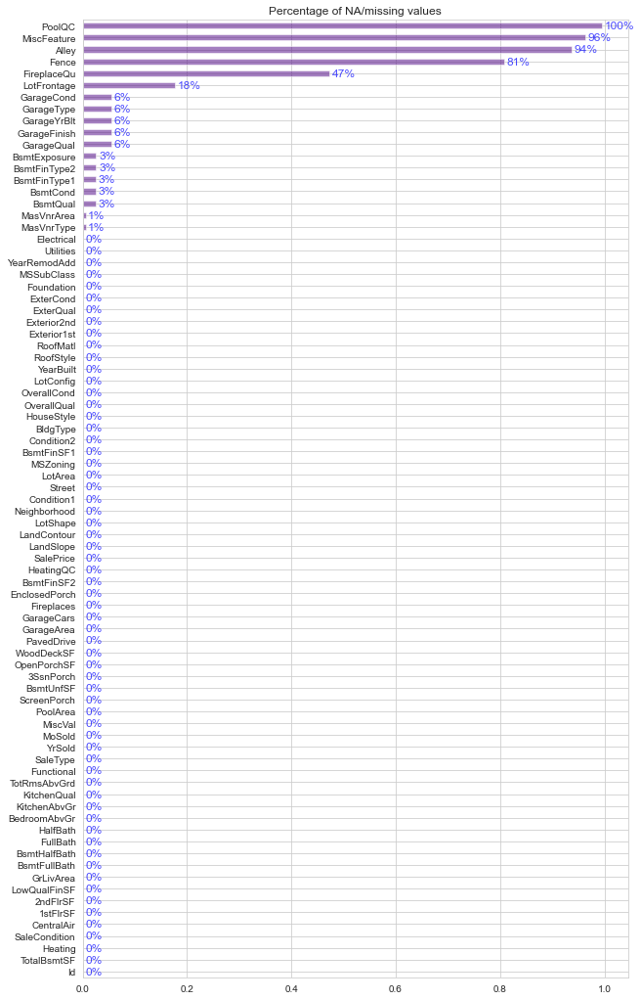

In [11]:
### Checking for missing/NA values via visualization
ax = df.isna().sum().transform(lambda x:x/df.shape[0]).sort_values().plot.barh(
    figsize=(10,18), title='Percentage of NA/missing values', color='indigo', alpha=0.5)
for i in ax.patches:
    ax.text(i.get_width()+0.005, i.get_y(), str(int(round(i.get_width(),2)*100))+'%', fontsize=12, color='b', alpha=0.7);

 ####  The NA values in this data are quite massive. From the above plot we can observer that PoolQC has the highest "NA" value (more than 90% of the records)  followed by MscFeature 96%, Alley 94%, Fence 81% etc. But we wouldn't be droping these columns. NA values in several columns simply means that the property doesn't have the mentioned attribute : NA value in Alley → the property has no alley access, NA value in PoolQC → the property has no pool and so on...
####  We can simply replace the NA values in several columns by new categorical value 'None'. These columns are: Alley, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageType, GarageYrBlt, GarageFinish, GarageQual, GarageCond, PoolQC, Fence, MiscFeature.

#### Exception:
One house has unfinished basement (which means it has a basement) but NA value of exposure (which means it has no basement) → contradictive, deal with that later.
One house has NA value in BsmtFinType2 (which means it has no basement) but other features show that it has a basement → contradictive, deal with that later.
GarageYrBlt is actually a numerical feature, but it has NA values (which means no garage), so it must be filled with numerical values too → deal with that later.


In [12]:
columns_with_miss = df.isna().sum()
#filtering only the columns with at least 1 missing value
columns_with_miss = columns_with_miss[columns_with_miss!=0]
#The number of columns with missing values
print('Columns with missing values:', len(columns_with_miss))
#sorting the columns by the number of missing values descending
columns_with_miss.sort_values(ascending=False)


Columns with missing values: 19


PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtExposure      38
BsmtFinType2      38
BsmtFinType1      37
BsmtCond          37
BsmtQual          37
MasVnrArea         8
MasVnrType         8
Electrical         1
dtype: int64

In [13]:
#separate variables into new data frames
numeric_data = df.select_dtypes(include=[np.number])
categorical_data = df.select_dtypes(exclude=[np.number])
print("There are {} numeric and {} categorical columns in train data".format(numeric_data.shape[1],categorical_data.shape[1]))

There are 38 numeric and 43 categorical columns in train data


In [14]:
# Check which non-numeric columns are missing values and what the possible values are for each object column
def check_numeric(df):
    # check_cols = df.select_dtypes([np.object]).columns
    for col in numeric_data:
#        print("Values of {} are {}.".format(col,df[col].unique()))
        n_nan = df[col].isnull().sum()
        if n_nan > 0:
            print("{} has {} NaNs".format(col,n_nan))
    return

check_numeric(numeric_data)

LotFrontage has 259 NaNs
MasVnrArea has 8 NaNs
GarageYrBlt has 81 NaNs


In [15]:
# Check which non-numeric columns are missing values and what the possible values are for each object column
def check_non_numeric(df):
    # check_cols = df.select_dtypes([np.object]).columns
    for col in categorical_data:
#        print("Values of {} are {}.".format(col,df[col].unique()))
        n_nan = df[col].isnull().sum()
        if n_nan > 0:
            print("{} has {} NaNs".format(col,n_nan))
    return

check_non_numeric(categorical_data)

Alley has 1369 NaNs
MasVnrType has 8 NaNs
BsmtQual has 37 NaNs
BsmtCond has 37 NaNs
BsmtExposure has 38 NaNs
BsmtFinType1 has 37 NaNs
BsmtFinType2 has 38 NaNs
Electrical has 1 NaNs
FireplaceQu has 690 NaNs
GarageType has 81 NaNs
GarageFinish has 81 NaNs
GarageQual has 81 NaNs
GarageCond has 81 NaNs
PoolQC has 1453 NaNs
Fence has 1179 NaNs
MiscFeature has 1406 NaNs


Out of 81 columns, 19 have missing values.
Missing values per se it not a big problem, but columns with a high number of missing values can cause distortions.
This is the case for:
PoolQC (Pool quality)
MiscFeature (Miscellaneous feature not covered in other categories)
Alley (Type of alley access to property)
Fence (Fence quality).

FireplaceQu has 690 missing values, which is also pretty high.

In this case, the missing values have meaning, which is "NO Fireplace". Fireplace has the following categories:

Ex Excellent - Exceptional Masonry Fireplace
Gd Good - Masonry Fireplace in main level
TA Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
Fa Fair - Prefabricated Fireplace in basement
Po Poor - Ben Franklin Stove
NA No Fireplace
Let's check the correlation between FireplaceQu and SalePrice, to see how important this feature is in order to determine the price.

In [17]:
# First, we will replace the missing values for 0. Then, we encode the categories into numbers from 1 to 5.
df['FireplaceQu'].fillna(0, inplace=True)
df['FireplaceQu'].replace({'Po': 1, 'Fa': 2, \
'TA': 3, 'Gd': 4, 'Ex': 5}, inplace=True)

<AxesSubplot:title={'center':'FirePlace vs SalePrice'}, xlabel='FireplaceQu', ylabel='SalePrice'>

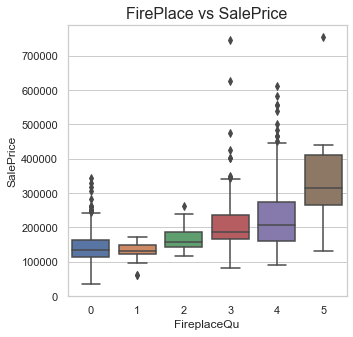

In [20]:
# Using a barplot, we can see how the category of the FirePlace increases the value of SalePrice. It is also worth noting how much higher the value is when the house has an Excellent fireplace. This means we should keep FireplaceQu as feature.
plt.subplots(figsize=(5,5))
plt.title('FirePlace vs SalePrice',fontsize= 16)
sns.set(style="whitegrid")
sns.boxplot(x='FireplaceQu', y="SalePrice", data=df)


### Missing values in Numeric columns

In [21]:
# Another feature with a high number of missing values is LotFrontage with a count 259.
# Let’s see the correlation between the remaining features with missing values and the SalePrice.

columns_with_miss = df.isna().sum()
columns_with_miss = columns_with_miss[columns_with_miss!=0]
c = list(columns_with_miss.index)
c.append('SalePrice')
df[c].corr()

,LotFrontage,MasVnrArea,GarageYrBlt,SalePrice
LotFrontage,1.000000,0.193458,0.070250,0.351799
MasVnrArea,0.193458,1.000000,0.252691,0.477493
GarageYrBlt,0.070250,0.252691,1.000000,0.486362
SalePrice,0.351799,0.477493,0.486362,1.000000


In [ ]:
# Note that LotFrontage, MasVnrArea, and GarageYrBlt have a positive correlation with SalePrice, but this correlation isn't very strong.

# cols_to_be_removed = ['LotFrontage', 'GarageYrBlt', \
#  'MasVnrArea']
# df.drop(columns=cols_to_be_removed, inplace=True)

In [22]:
# Finally, these are the remaining columns with missing values:

columns_with_miss = df.isna().sum()
columns_with_miss = columns_with_miss[columns_with_miss!=0]
print(f'Columns with missing values: {len(columns_with_miss)}')
columns_with_miss.sort_values(ascending=False)

Columns with missing values: 18


PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
LotFrontage      259
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtExposure      38
BsmtFinType2      38
BsmtCond          37
BsmtFinType1      37
BsmtQual          37
MasVnrArea         8
MasVnrType         8
Electrical         1
dtype: int64

### Categorical variables
##### Let's work on the categorical variables of our dataset. Dealing with missing values. Filling Categorical NaN that we know how to fill due to the description file.

It's found that variables related to "Garage" (GarageQual, GarageCond, GarageFinish, GarageYrBlt) has 81 missing values. A close observation also shows that the numeric feature "GarageCars" has zeros for rows where other "Garage' variables are "NaN". "NaN" could mean that the house doesn't have a Garage, it could also mean that there was an error when collecting the dataset; To be clear on that, let's explore it with respect to other variables like "HouseStyle", "Foundation", "Neighborhood", "LotShape" and "MSSubClass".

In [33]:
df[df["GarageCond"].isnull()][["GarageQual", "GarageFinish","GarageCars","HouseStyle","BsmtCond", "BsmtQual"]].head(15)

,GarageQual,GarageFinish,GarageCars,HouseStyle,BsmtCond,BsmtQual


In [35]:
df[df["GarageYrBlt"].isnull()][["GarageQual","GarageType","GarageCars","HouseStyle","Neighborhood", "Foundation"]].head(23)

,GarageQual,GarageType,GarageCars,HouseStyle,Neighborhood,Foundation


From the above observation, we can ascertain that "NaN" means that the house's type doesn't have Garage varaiables (GarageQual, GarageCond, GarageFinish, GarageYrBlt), to handle that we will impute them using the mode of these respective variables

In [32]:
# Fills NA in place of NaN
for c in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond','BsmtFinType2', \
'BsmtExposure', 'BsmtFinType1']:
    df[c].fillna('NA', inplace=True)
    
# Fills None in place of NaN
df['MasVnrType'].fillna('None', inplace=True)
df['GarageYrBlt'].fillna(np.nanmedian(df['GarageYrBlt']), inplace=True)

In [37]:
# With this have only 9 columns with missing values left in our dataset.

columns_with_miss = df.isna().sum()
columns_with_miss = columns_with_miss[columns_with_miss!=0]
print(f'Columns with missing values: {len(columns_with_miss)}')
columns_with_miss.sort_values(ascending=False)


Columns with missing values: 9


PoolQC         1451
MiscFeature    1402
Alley          1365
Fence          1176
LotFrontage     259
BsmtQual         37
BsmtCond         37
MasVnrArea        8
Electrical        1
dtype: int64

### Ordinal
By reading the data_description file, we can identify other variables that have a similar system to FireplaceQu to categorize the quality: Poor, Good, Excellent, etc. We are going to replicate the treatment we gave to FireplaceQu to these variables according to the following descriptions:

ExterQual: Evaluates the quality of the material on the exterior
Ex Excellent
Gd Good
TA Average/Typical
Fa Fair
Po Poor

ExterCond: Evaluates the present condition of the material on the exterior
Ex Excellent
Gd Good
TA Average/Typical
Fa Fair
Po Poor

BsmtQual: Evaluates the height of the basement
Ex Excellent (100+ inches)
Gd Good (90-99 inches)
TA Typical (80-89 inches)
Fa Fair (70-79 inches)
Po Poor ( < 70 inches)
NA No Basement

BsmtCond: Evaluates the general condition of the basement
Ex Excellent
Gd Good
TA Typical - slight dampness allowed
Fa Fair - dampness or some cracking or settling
Po Poor - Severe cracking, settling, or wetness
NA No Basement

HeatingQC: Heating quality and condition
Ex Excellent
Gd Good
TA Average/Typical
Fa Fair
Po Poor

KitchenQual: Kitchen quality
Ex Excellent
Gd Good
TA Average/Typical
Fa Fair
Po Poor

GarageQual: Garage quality
Ex Excellent
Gd Good
TA Average/Typical
Fa Fair
Po Poor
NA No Garage

GarageCond: Garage condition
Ex Excellent
Gd Good
TA Average/Typical
Fa Fair
Po Poor
NA No Garage

In [38]:
ord_cols = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', \
'HeatingQC', 'KitchenQual', 'GarageQual', 'GarageCond']
for col in ord_cols:
    df[col].fillna(0, inplace=True)
    df[col].replace({'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, \
    'Ex': 5}, inplace=True)

In [40]:
# Let's now plot the correlation of these variables with SalePrice.
ord_cols = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', \
'HeatingQC', 'KitchenQual', 'GarageQual', 'GarageCond']
f, axes = plt.subplots(2, 4, figsize=(15, 10), sharey=True)

for r in range(0, 2):
    for c in range(0, 4):
        data=df, ax=axes[r][c]

plt.tight_layout()
plt.show()

TypeError: cannot unpack non-iterable AxesSubplot object

As you can see, the better the category of a variable, the higher the price, which means these variables will be important for a prediction model.

#### Nominal
Other categorical variables don't seem to follow any clear ordering. Let's see how many values these columns can assume:

In [ ]:
cols = df.columns
num_cols = df._get_numeric_data().columns
nom_cols = list(set(cols) - set(num_cols))
print(f'Nominal columns: {len(nom_cols)}')

value_counts = {}
for c in nom_cols:
    value_counts[c] = len(df[c].value_counts())

sorted_value_counts = {k: v for k, v in \
sorted(value_counts.items(), key=lambda item: item[1])}
sorted_value_counts

Some categorical variables can assume several different values like Neighborhood.
To simplify, let's analyze only variables with 9 different values or less.

In [ ]:
# Plotting against SalePrice to have a better idea of how they affect it:

ncols = 3
nrows = math.ceil(len(nom_cols_less_than_6) / ncols)
f, axes = plt.subplots(nrows, ncols, figsize=(15, 30))

for r in range(0, nrows):
    for c in range(0, ncols):
        if not nom_cols_less_than_6:
            continue
        sns.boxplot(x=nom_cols_less_than_6.pop(), \
        y="SalePrice", data=train, ax=axes[r][c])

plt.tight_layout()
plt.show()

We can see a good correlation of many of these columns with the target variable. For now, let's keep them.
We still have NaN in 'Electrical'. As we could see in the plot above, 'SBrkr' is the most frequent value in 'Electrical'.
Let's use this value to replace NaN in Electrical.

In [ ]:
# Inputs more frequent value in place of NaN
train['Electrical'].fillna('SBrkr', inplace=True)

### Zero values

In [ ]:
# Another quick check is to see how many columns have lots of data equals to 0.

df.isin([0]).sum().sort_values(ascending=False).head(25)

In this case, even though there are many 0's, they have meaning. For instance, PoolArea (Pool area in square feet) equals 0 means that the house doesn't have any pool area. This is important information correlated to the house and thus, we are going to keep them.

### Outliers

In [ ]:
# We will take a look at the outliers in the numeric variables.
# Get only numerical columns
numerical_columns = \
list(df.dtypes[df.dtypes == 'int64'].index)

len(numerical_columns)

In [ ]:
# Create the plot grid
rows = 7
columns = 6
fig, axes = plt.subplots(rows,columns, figsize=(30,30))

x, y = 0, 0
for i, column in enumerate(numerical_columns):
    sns.boxplot(x=train[column], ax=axes[x, y])
    
    if y < columns-1:
        y += 1
    elif y == columns-1:
        x += 1
        y = 0
    else:
        y += 1

There are a lot of outliers in the dataset. But, if we check the data description file, we see that, actually, some numerical variables, are categorical variables that were saved (codified) as numbers. So, some of these data points that seem to be outliers are, actually, categorical data with only one example of some category. Let's keep these outliers.

In [ ]:

#  The most important variable here is the target variable SalePrice. Let’s check its distribution.
plt.subplots(figsize=(5,5))f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, 
                                    figsize=(10,7), gridspec_kw={"height_ratios": (.15, .85)})
plt.suptitle('Distribution plot for "SalePrice"', fontsize = 20)
formater = tck.FuncFormatter(currency)
ax_hist.xaxis.set_major_formatter(formater)
sns.boxplot(df['SalePrice'].dropna(), ax= ax_box)
sns.distplot(df['SalePrice'].dropna(), ax= ax_hist)
ax_box.set(xlabel='')

####  The SalePrice does not follow normal distribution. It has positive skewness. It shows that very small number of houses have very high SalePrice. Also the SalePrice is not linear, which means we cannot find of a straight line that would fit through the SalePrice data. So we have to transform SalePrice so that it’ll have normal distribution.
#### When the target feature is normally distributed (or close to normal) target feature, it would help in better modeling of the relationship between target and the independent variables. Let's log transform this variable and see if this variable distribution can get any closer to normal.

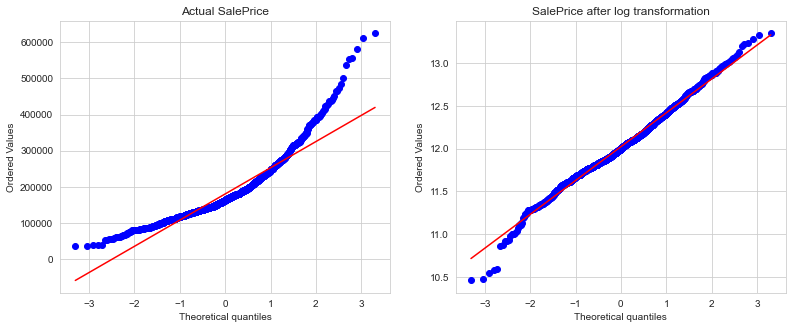

In [277]:
figure = plt.figure(figsize = (13,5))
plt.subplot(1,2,1)
stats.probplot(df.SalePrice, plot = plt)
plt.title("Actual SalePrice")
plt.subplot(1,2,2)
df.SalePrice = np.log(df.SalePrice)
stats.probplot(df.SalePrice, plot = plt)
plt.title("SalePrice after log transformation")
plt.show()

In [17]:
#Transforming the target variable
# df.drop("Id", inplace=True, axis=1)
target_variable = np.log(df['SalePrice'])

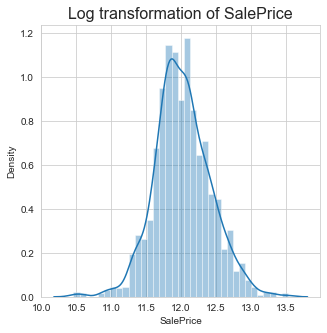

In [14]:
plt.subplots(figsize=(5,5))
plt.title('Log transformation of SalePrice',fontsize= 16)
sns.distplot(target_variable)
plt.show()

In [16]:
#skewness
print("The skewness of SalePrice is {}".format(target_variable.skew()))

The skewness of SalePrice is 0.12133506220520406


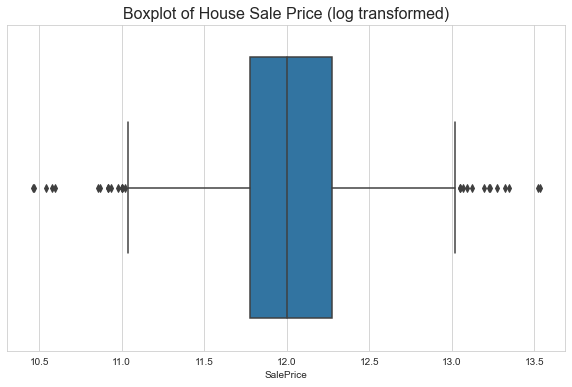

In [18]:
# create boxplot of the log transformed SalePrice

plt.subplots(figsize=(10,6))
plt.title('Boxplot of House Sale Price (log transformed)',fontsize= 16)
sns.boxplot(target_variable)
plt.show()

As we can saw, log transformation of the target variable has helped us fixing its skewed distribution and the new 
distribution looks closer to normal. Since we have 80 variables, visualizing one by one wouldn't be an astute 
approach. Instead, we'll look at some variables based on their correlation with the target variable (SalePrice). 
However, we will come up with a way to plot all variables at once, and we'll look at it as well. we'll separate 
numeric and categorical variables and explore this data from different angles.



The cheapest house sold for $34,900 and the most expensive for $625,000
The average sales price is $180,151, while median is $163,000


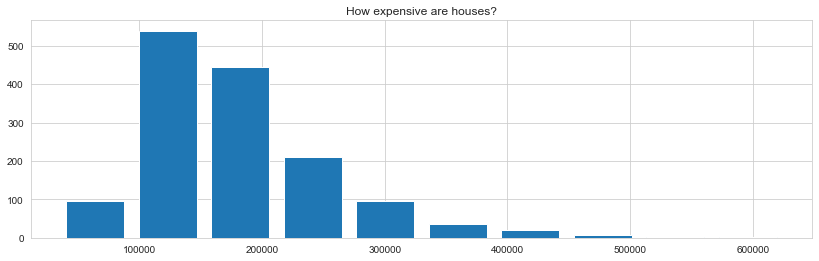

In [272]:
# How expensive are houses?
print('The cheapest house sold for ${:,.0f} and the most expensive for ${:,.0f}'.format(
    df.SalePrice.min(), df.SalePrice.max()))
print('The average sales price is ${:,.0f}, while median is ${:,.0f}'.format(
    df.SalePrice.mean(), df.SalePrice.median()))
df.SalePrice.hist(rwidth=.8, figsize=(14,4))
plt.title('How expensive are houses?')
plt.show()

We are going to check the correlation behavior of numeric variables. Out of 37 variables, 
I presume some of them must be correlated. If found, we can later remove these correlated variables as they 
won't provide any much useful information.



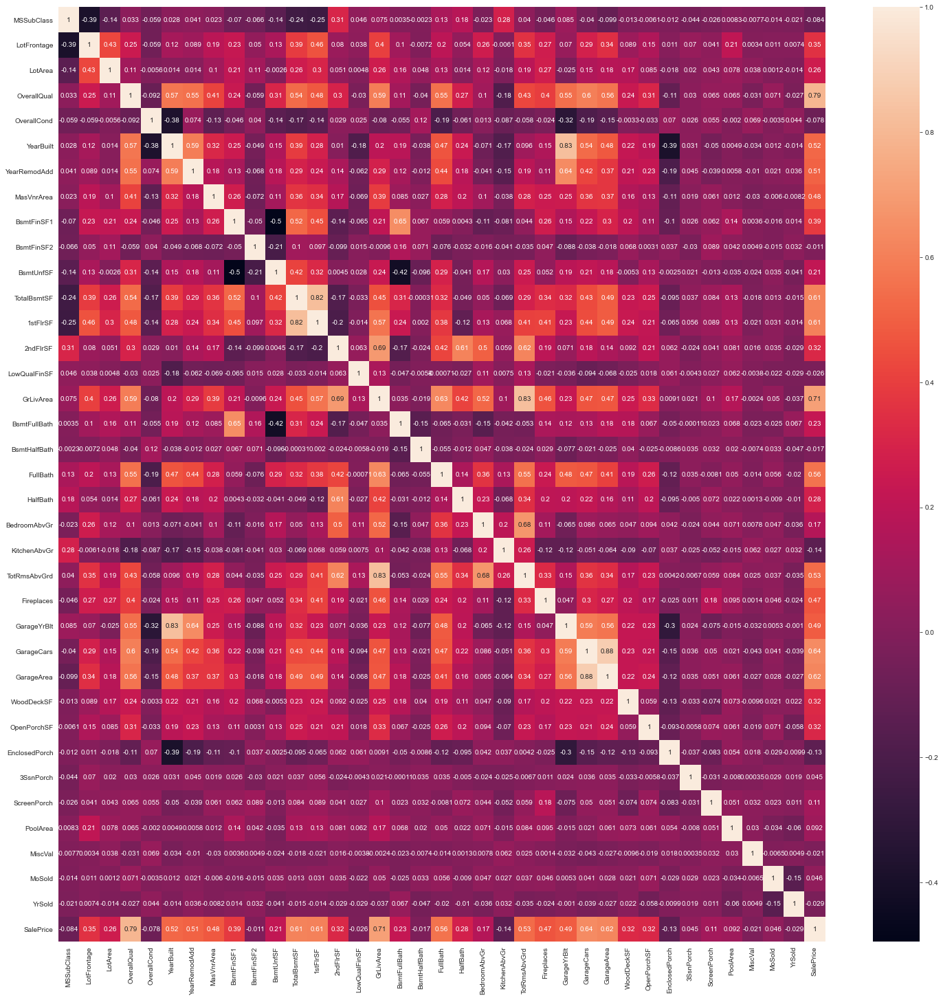

In [75]:
numeric_data_corr = numeric_data.corr()
plt.subplots(figsize=(25,25))
sns.heatmap(numeric_data_corr, annot=True)
plt.show()

From the last row of this map. We can see the correlation of all variables against SalePrice. As you can see, some variables seem to be strongly correlated with the target variable. Here we see that the OverallQual feature is 79% correlated with the target variable. Overallqual feature refers to the overall material and quality of the materials of the completed house. This make sense as well. People usually consider these parameters for their dream house. In addition, GrLivArea is 70% correlated with the target variable. GrLivArea refers to the living area (in sq ft.) above ground. The following variables show people also care about if the house has a garage, the area of that garage, the size of the basement area, etc.

In [77]:
# Let's check the OverallQual variable in detail.
df['OverallQual'].unique()

array([ 7,  6,  8,  5,  9,  4, 10,  3,  1,  2])

The overall quality is measured on a scale of 1 to 10. Hence, we can fairly treat it as an ordinal variable. An ordinal variable has an inherent order. Let's check the median sale price of houses with respect to OverallQual. You might be wondering, “Why median ?” We are using median because the target variable is skewed. A skewed variable has outliers and median is robust to outliers. We can create such aggregated tables using pandas pivot tables quite easily.

In [82]:
#let's check the mean price per quality and plot it.
pivot = df.pivot_table(index='OverallQual', values='SalePrice', aggfunc=np.median)
pivot

,SalePrice
OverallQual,
1,50150
2,60000
3,86250
4,108000
5,133000
6,160000
7,200141
8,269750
9,345000


Let's plot this table and understand the median behavior using a bar graph.

<AxesSubplot:xlabel='OverallQual'>

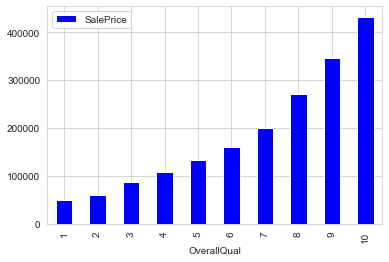

In [83]:
pivot.plot(kind='bar', color='blue')

<pre>
This behavior is quite normal. As the overall quality of a house increases, its sale price also increases. Let's visualize 
the next correlated variable GrLivArea and understand their behavior.
</pre>

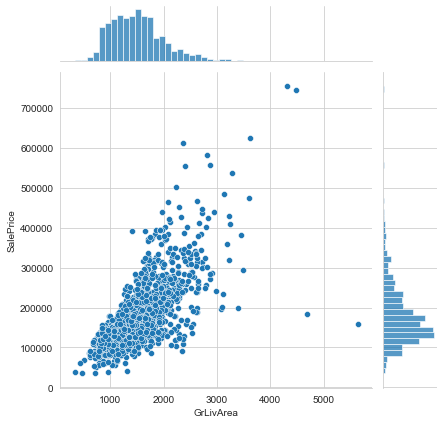

In [91]:
#GrLivArea variable
sns.jointplot(x=df['GrLivArea'], y=df['SalePrice'])
plt.show()

As seen above, here also we see a direct correlation of living area with sale price. However, we can spot an outlier value GrLivArea > 5000. I've seen outliers play a significant role in spoiling a model's performance. Hence, we'll get rid of it.

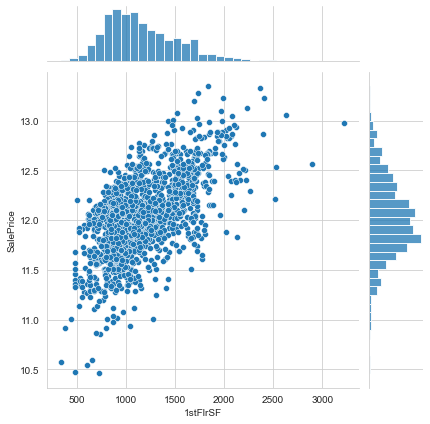

In [281]:
sns.jointplot(x=df['1stFlrSF'], y=df['SalePrice']);

#### From the scatter plot, we see here that we have a positive relationship between the 1stFlrSF of the house and the SalePrice of the house. In other words, the larger the first floor of a house, the higher the likely sale price.



#### Now, we'll move forward and explore categorical features. The simplest way to understand categorical variables is using .describe() command.

In [93]:
categorical_data.describe()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


Let's check the median sale price of a house based on its SaleCondition. SaleCondition explains the condition of sale. Not much information is given about its categories.

In [94]:
sp_pivot = df.pivot_table(index='SaleCondition', values='SalePrice', aggfunc=np.median)
sp_pivot

,SalePrice
SaleCondition,
Abnorml,130000
AdjLand,104000
Alloca,148145
Family,140500
Normal,160000
Partial,244600


<AxesSubplot:xlabel='SaleCondition'>

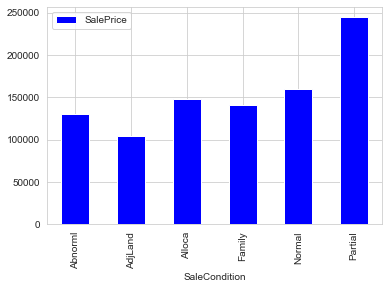

In [95]:
sp_pivot.plot(kind='bar',color='blue')

We see that SaleCondition <b> Partial </b> has the highest mean sale price; like we used correlation to determine the influence of numeric features on SalePrice. Similarly, we'll use the ANOVA test to understand the correlation between categorical variables and SalePrice. ANOVA test is a statistical technique used to determine if there exists a significant difference in the mean of groups. If for example we have two variables A and B, and of these variables has 3 levels (a1,a2,a3 and b1,b2,b3). If the mean of these levels with respect to the target variable is the same, the ANOVA test will capture this behavior and we can safely remove them. While using ANOVA, our hypothesis is as follows:

<b>Ho</b> - There exists no significant difference between the groups. <b>Ha</b> - There exists a significant difference between the groups.
Now, we'll define a function which calculates p values. From those p values, we'll calculate a disparity score. The higher the disparity score, the better the feature in predicting sale price.

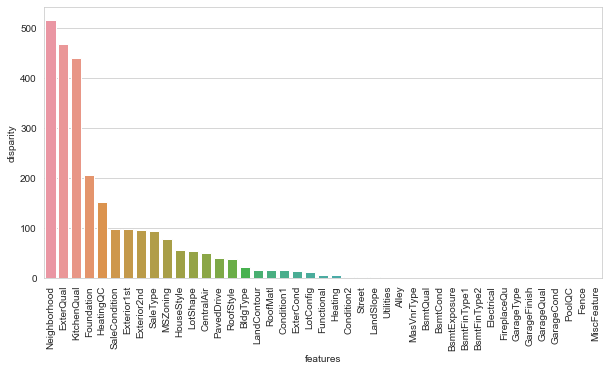

In [110]:
cat = [f for f in df.columns if df.dtypes[f] == 'object']
def anova_test(frame):
    anv = pd.DataFrame()
    anv['features'] = cat
    pvals = []
    for c in cat:
           samples = []
           for cls in frame[c].unique():
                  s = frame[frame[c] == cls]['SalePrice'].values
                  samples.append(s)
           pval = stats.f_oneway(*samples)[1]
           pvals.append(pval)
    anv['pval'] = pvals
    return anv.sort_values('pval')

categorical_data['SalePrice'] = df.SalePrice.values
k = anova_test(categorical_data) 
k['disparity'] = np.log(1./k['pval'].values) 
plt.subplots(figsize=(10,5))
sns.barplot(data=k, x = 'features', y='disparity') 
plt.xticks(rotation=90) 
plt.show() 

Here we see that among all categorical variablesNeighborhoodturned out to be the most important feature followed by ExterQual, KitchenQual, etc. It means that people also consider the goodness of the neighborhood, the quality of the kitchen, the quality of the material used on the exterior walls, etc. Finally, to get a quick glimpse of all variables in a data set, let's plot histograms for all numeric variables to determine if all variables are skewed. For categorical variables, we'll create a boxplot and understand their nature.

#

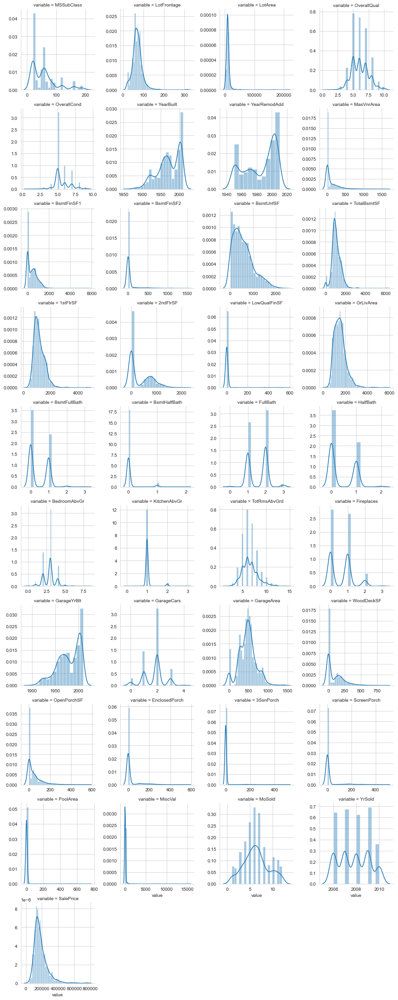

In [113]:
#create numeric plots
num = [f for f in df.columns if df.dtypes[f] != 'object']
# num.remove('Id')
nd = pd.melt(df, value_vars = num)
n1 = sns.FacetGrid (nd, col='variable', col_wrap=4, sharex=False, sharey = False)
n1 = n1.map(sns.distplot, 'value')
n1

As you can see, most of the variables are right skewed. We'll have to transform them in the next stage. Now, let's create boxplots for visualizing categorical variables.

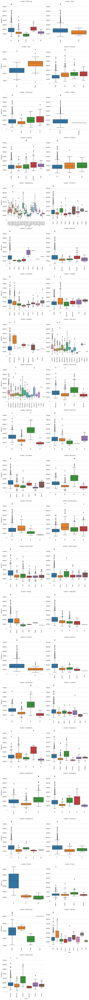

In [114]:
def boxplot(x,y,**kwargs):
            sns.boxplot(x=x,y=y)
            x = plt.xticks(rotation=90)

cat = [f for f in df.columns if df.dtypes[f] == 'object']

p = pd.melt(df, id_vars='SalePrice', value_vars=cat)
g = sns.FacetGrid (p, col='variable', col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, 'value','SalePrice')
g

### EDA 1
#### We start by looking at the distribution of the sales price, this we give us an insight of how the sales price are distributed. The price range for the cheapest, the costliest house etc. We will accomplish this using a histogram chart.

In [24]:
# details = rstr(df, 'SalePrice')
# display(details.sort_values(by='corr SalePrice', ascending=False))

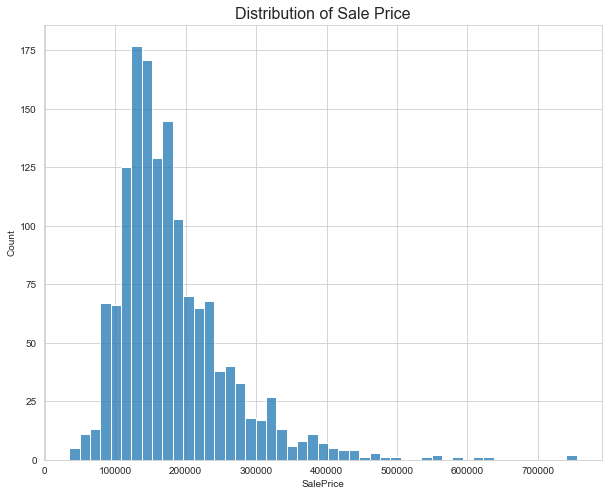

In [12]:
plt.subplots(figsize=(10,8))
plt.title('Distribution of Sale Price',fontsize= 16)
sns.histplot(df.SalePrice)
plt.show()

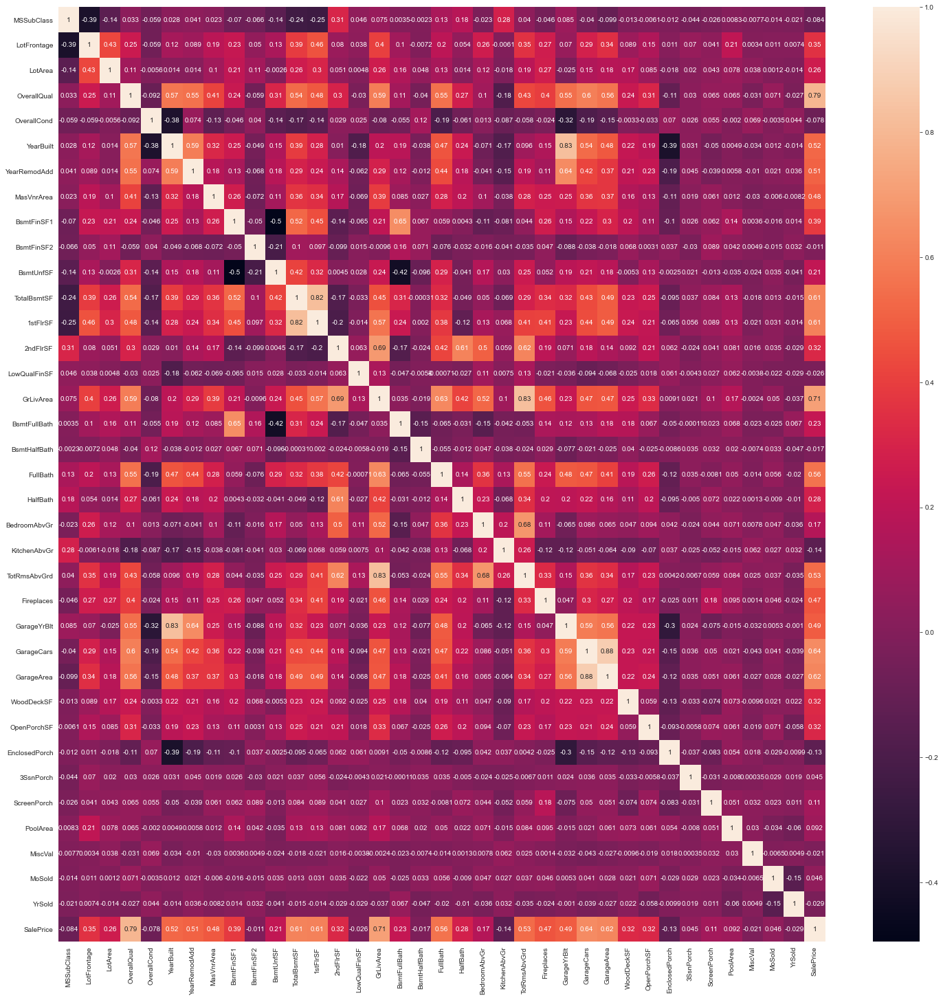

In [23]:
df = df.drop("Id", inplace=False, axis=1)
correlation = df.corr()
plt.subplots(figsize=(25,25))
sns.heatmap(correlation, annot=True)
plt.show()

### Observations:
<pre>
From the above chart it can be observed that about <b>60</b> houses were sold for price below <b>$10,000</b>. The highest sales of about <b>
120 </b> houses and above were made within the price range of <b>$10,000 - $20,000</b>. Within the price range of <b> $20,000 to $30,000 
about 10-110 </b> houses were sold. Between <b> $30,000 - $40,000 5 - 26 </b> houses were sold. The other sales of <b> $60,000 - $80,000 </b> 
looks like outliers. We wouldn't conclude until have explored the properties of the houses that were sold within that price range.
</pre>

### EDA 2.0
<pre>
The next insight we would be inspecting is the average cost of house in different Sale Zones: Agricultural, Industrial, Residential 
Zones etc. to that effect we use the MSZoning feature; this would be accomplished using a bar chart
</pre>

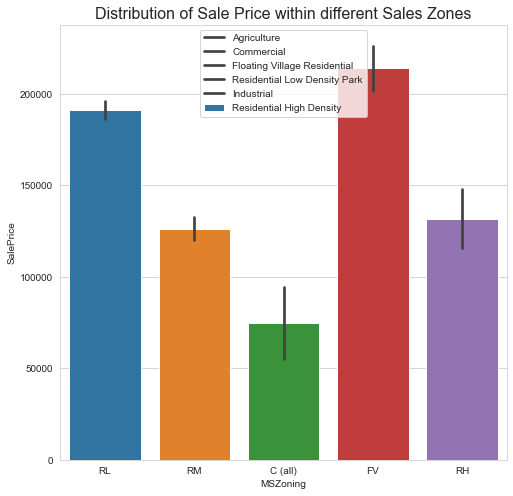

In [45]:
plt.subplots(figsize=(8,8))
plt.title('Distribution of Sale Price within different Sales Zones',fontsize= 16)
sns.barplot(df.MSZoning,df.SalePrice)
plt.legend(["Agriculture", "Commercial","Floating Village Residential","Residential Low Density Park", "Industrial", \
    "Residential High Density","Residential Low Density",  "Residential Low Density Park"])
plt.show()

In [14]:
(df.groupby('MSZoning').mean())['SalePrice'].round()

MSZoning
C (all)     74528.0
FV         214014.0
RH         131558.0
RL         191005.0
RM         126317.0
Name: SalePrice, dtype: float64

### Observation:
    From the above bar chart it can be observed that the average distribution of selling price of houses in the 
    following zones is as follows: 
        A	Agriculture                       $74528.00
        C	Commercial                        $74528.00
        FV	Floating Village Residential    $214,014.00
        I	Industrial                       $74,528.00
        RH	Residential High Density        $131,558.00
        RL	Residential Low Density         $191,005.00
        RP	Residential Low Density Park     $74,528.00
        RM  Residential Medium Density      $126,317.00

We can can say that the Saleing price at zones like FV (Floating Village Residential) $214,014.00, RL (Residential Low Density) $191,005.00 is higher when compare to zones like Agriculture, Commerical and RP (Residential Low Density Park).

### EDA 2.1
<pre>
Let's also view the distribution of the house prices within these zones, we would accomplish this using a boxplot chart. The boxplot 
chart shows what price ranges are outside the normal in those areas. These abnormal price ranges are called outliers.
<pre

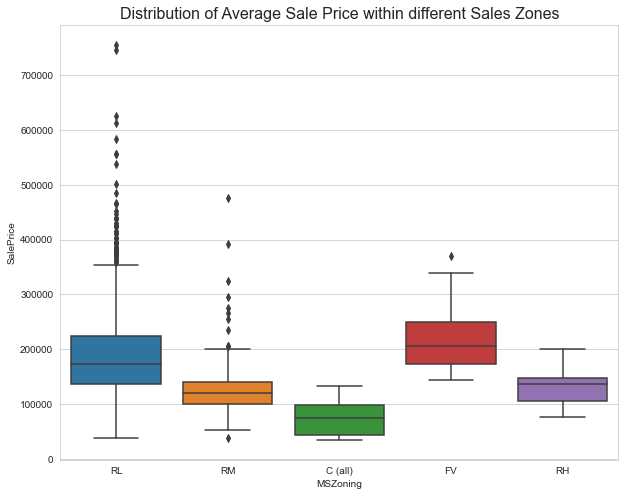

In [15]:
plt.subplots(figsize=(10,8))
plt.title('Distribution of Average Sale Price within different Sales Zones',fontsize= 16)
sns.boxplot(df.MSZoning,df.SalePrice)
plt.show()

### Observations:
<pre>
From the above boxplot we see that FV (Floating Village Residential) has the highest sales with the average SalePrice of about $200000 and 25 percentile of the </br> SalePrice is about $150,000. SalePrice of $380,000 and above in the FV (Floating Village Residential Zone) is an outliers because it's above the 75 percentile </br> of the SalePrice for that Zone. The next is the RL (Residential Low Density) with average SalePrice of about $180,0000 and a low SalePrice of about $40000. </br> RH (Residential High Density Park) and RM (Residential Med) have almost the 75 percentile of SalePrice, but the average SalePrice of RH is about $150,000 </br> above the RM. The last but not the least is the c (Commerical Zone) whose average SalePrice is below $100,000.
<pre>

### EDA 3
<pre>
Next we inspect if the sales price depends on the lot size area. Does the cost of a house increase with the lot size area or vice versa? 
We will accomplish this using a scatterplot, by plotting the sales price against LotSizeArea.
</pre>

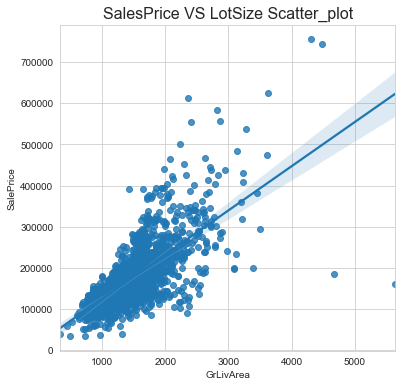

In [17]:
plt.subplots(figsize=(6,6))
plt.title('SalesPrice VS LotSize Scatter_plot',fontsize= 16)
sns.regplot(x="GrLivArea", y="SalePrice", data=df);

### Observation:
<pre>
    From the above scatterplot we can observe that the SalePrice has a strong relationship with the LotSize, i.e an increase in LotSize 
    drives an increase in SalePrice.
</pre>

In [91]:
dd = df.dropna(thresh=int(df.shape[0]*.80), axis=1)

### EDA 4.0
Another insight could be to know if the SalePrice of a house increase with the age of the house. Even though the age wasn't given, we can will create a feature called age, but subtracting the year built from the current year we are in or any of your choosing. If you do this you may now plot the sales price against the age of the house, using a scatter plot.


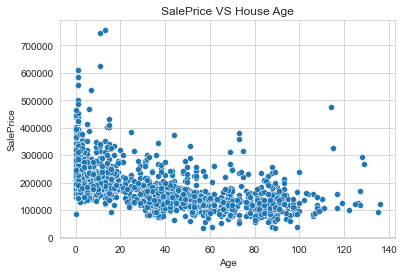

In [36]:
df["Age"] = df["YrSold"] - df["YearBuilt"]
sns.scatterplot(x='Age', y='SalePrice', data=df)
plt.title('SalePrice VS House Age')
plt.show()

### Observation:
From the scatter plot, More of newer houses were sold at higher prices when compared to above 40 years. The sales didn't really drop except for houses that are 100years and above. Another thing to consider when looking at year greater than or equal to 40 years, did renovation of the house bring about the increase SalePrice.

### EDA 4.1
#### Price per square foot
It's useful to look at price per square foot, a typically used metric. The majority of SalePrice during the time period 
were focused around a price of roughly $125 per square foot.

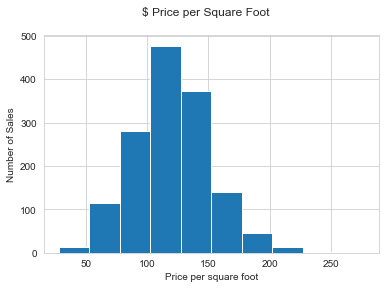

In [44]:
df['PriceSquareFoot'] = df['SalePrice']/df['GrLivArea']
plt.hist(df['PriceSquareFoot'])
plt.suptitle('$ Price per Square Foot')
plt.ylabel('Number of Sales')
plt.xlabel('Price per square foot')
plt.show()

### EDA 4.2
##### SalePrice by neighborhood
<pre>
Next we explore the neighbourhood feature, in which neighbourhood does house price cost the more? 
What’s the average or median cost of a house in those neighbourhood?
</pre>

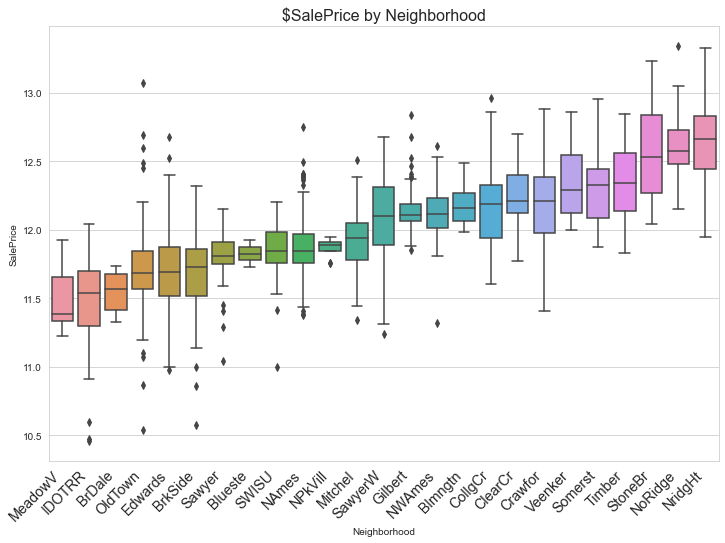

In [304]:
plt.figure(figsize=(12,8))
plt.title('$SalePrice by Neighborhood',fontsize= 16)
sorted_nb = df.groupby(['Neighborhood'])['SalePrice'].median().sort_values()
sns.boxplot(x=df['Neighborhood'], y=df['SalePrice'], order=list(sorted_nb.index))
plt.xticks(rotation=45, horizontalalignment='right',fontweight='light',fontsize='x-large')
plt.show()

<p>
In the above plot we sorted our neighborhoods by median price. This figure gives us a lot of information. We can see that in the cheapest neighborhoods houses sell for a median price of around $100,000 and in the most expensive neighborhoods houses sell for around $300,000. We can also see that for some neighborhoods, dispersion between the prices is very low, meaning that all the prices are close to each other. In the most expensive neighborhood NridgHt, however, we see a large box — there is large dispersion in the distribution of prices.
</p>

### EDA 5.0
#### SalePrice and Sales by Month
<pre>
Another is at which months of the year is house mostly sold and is cheapest? The idea is that the cost of a house may drop at months where a great number of 
houses are being sold. Use the countplot function of seaborn to get the total houses sold in various months and barchart to get the average cost of houses 
at those months. You may also check which years did we have the greatest house sales and what was the total revenue generated in those years?
</pre>

Oldest house built in 1872. Newest house built in 2010.


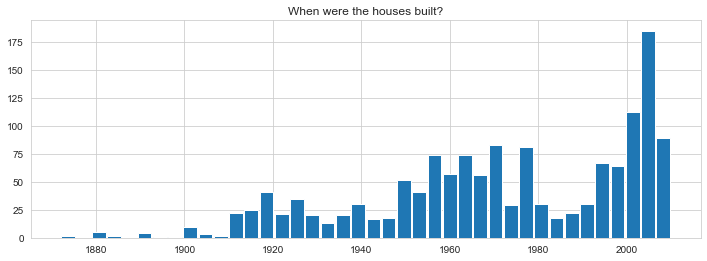

In [314]:
# When were the houses built?
print('Oldest house built in {}. Newest house built in {}.'.format(
    df.YearBuilt.min(), df.YearBuilt.max()))
df.YearBuilt.hist(bins = 40, rwidth=.9, figsize=(12,4))
plt.title('When were the houses built?')
plt.show()

Not much action in the 80s apparently. Looks like majority of houses were built in the 50s and after, which good chunk of new houses built in the aughts.

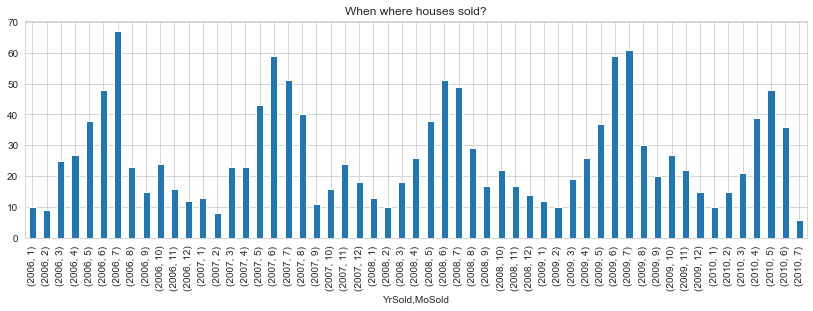

In [9]:
# When where houses sold?
df.groupby(['YrSold','MoSold']).Id.count().plot(kind='bar', figsize=(14,4))
plt.title('When where houses sold?')
plt.show()

So this is interesting. We see a strong seasonal pattern in house sales, with peaks in June and July. We verify that the dataset spans 2006 to 2010, but note that data steps mid-year in July of 2010.
At this point I'm wondering if the time of year a house is sold has any effect on sales price. We'll address this question once we start our multivariate analysis later on.

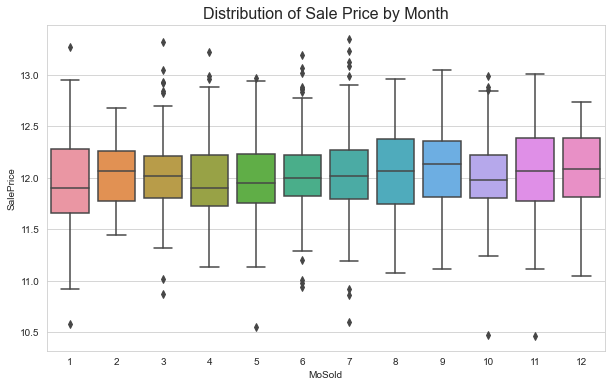

In [326]:
plt.subplots(figsize=(10,6))
plt.title('Distribution of Sale Price by Month',fontsize= 16)
sns.boxplot(df.MoSold, df.SalePrice)
plt.show()

### EDA 5.1
#### SalePrice by overall quality
<pre>
SalePrice by overall quality appears to reflect quality to some degree. 
</pre>

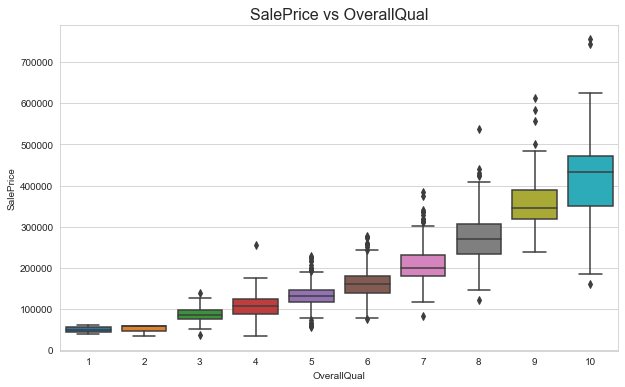

In [75]:
plt.subplots(figsize=(10,6))
plt.title('SalePrice vs OverallQual',fontsize= 16)
sns.boxplot(df.OverallQual, df.SalePrice)
plt.show()

### EDA 5.2
#### Price Square Foot vs Over all Quality

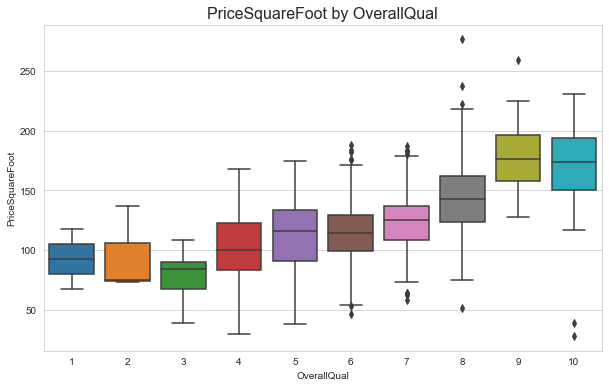

In [73]:
plt.subplots(figsize=(10,6))
plt.title('PriceSquareFoot by OverallQual',fontsize= 16)
sns.boxplot(df.OverallQual, df.PriceSquareFoot)
plt.show()

### EDA 5.3
#### SalePrice vs 
Another is at which months of the year is house mostly sold and is cheapest? The idea is that the cost of a house may drop at months where a great number of 
houses are being sold. Use the countplot function of seaborn to get the total houses sold in various months and barchart to get the average cost of houses 
at those months. You may also check which years did we have the greatest house sales and what was the total revenue generated in those years?

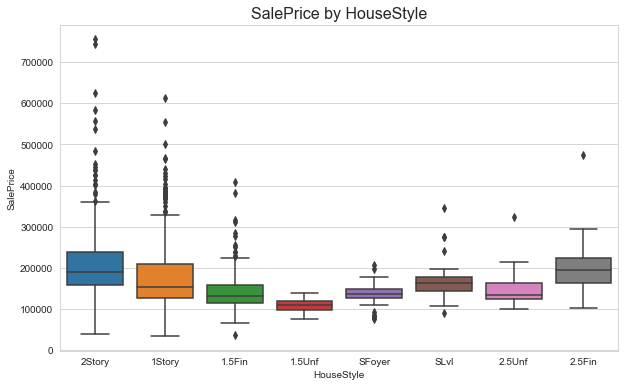

In [71]:
plt.subplots(figsize=(10,6))
plt.title('SalePrice by HouseStyle',fontsize= 16)
sns.boxplot(df.HouseStyle, df.SalePrice)
plt.show()

In [ ]:
#### Observation:
From the above scatter ploat

### We have explored a lot of features in the dataset with respect to the SalePrice, many of which has strong relationship with the sales price. This 
### drives us to infere which of the features has the strong relationship with the SalePrice statistically using correlaton variance.

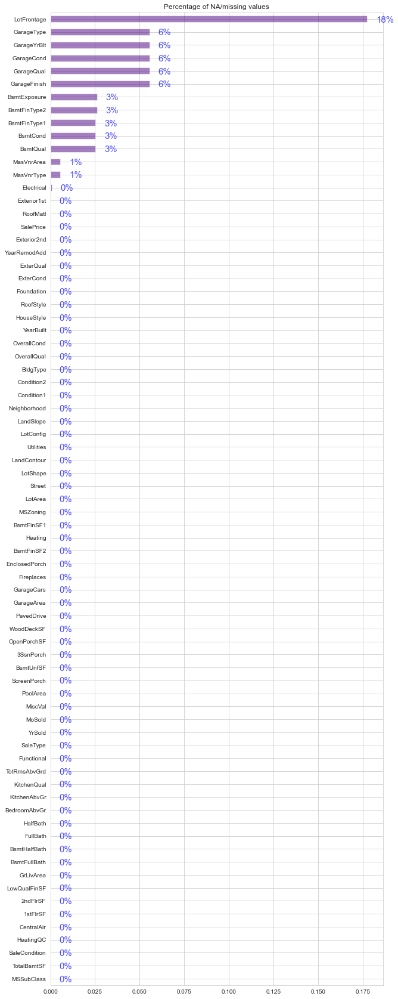

In [92]:
ax = dd.isna().sum().transform(lambda x:x/dd.shape[0]).sort_values().plot.barh(
    figsize=(10,30), title='Percentage of NA/missing values', color='indigo', alpha=0.5)
for i in ax.patches:
    ax.text(i.get_width()+0.005, i.get_y(), str(int(round(i.get_width(),2)*100))+'%', fontsize=15, color='b', alpha=0.7);

a. What is the total revenue I have made since inception? What is the yearly sales like? Which of the months do we normally have huge sales?
b. Which neighbourhood have we sold more houses and what's the distribution of revenues we have generated from these neighbourhood?

In [9]:
def display_columns(columns_to_display):
    return df[columns_to_display][:100]

<font >There are four different generic data types defined that are casted as follows:
- continuous -> np.float64
- discrete -> actually np.int64 but np.float64 because of missing values
- nominal -> object (str)
- ordinal -> object (str)
</font>

In [10]:
TARGET_VARIABLE = ["SalePrice"]

=============================================================================================
<h4>Continous Columns and their full description</h4>
<pre> 
1stFlrSF =======>  First Floor square feet
2ndFlrSF =======>  Second floor square feet
3SsnPorch =======>  Three season porch area in square feet
BsmtUnfSF  =======> Unfinished square feet of basement area
BsmtFinSF1 =======>  Type 1 finished square feet
BsmtFinSF2 =======> Type 2 finished square feet
EnclosedPorch =======> Enclosed porch area in square feet
GarageArea =======> Size of garage in square feet
GrLivArea =======>  Above grade (ground) living area square feet
LotArea =======> Lot size in square feet
LotFrontage =======> Linear feet of street connected to property
LowQualFinSF =======> Low quality finished square feet (all floors)
MasVnrArea =======> Masonry veneer area in square feet
MiscVal =======>  $Value of miscellaneous feature
OpenPorchSF =======> Open porch area in square feet
PoolArea =======>  Pool area in square feet
ScreenPorch =======>  Screen porch area in square feet
TotalBsmtSF =======>  Total square feet of basement area
WoodDeckSF =======>  Wood deck area in square feet
</pre>

In [11]:
CONTINOUS_COLUMNS = ["1stFlrSF", "2ndFlrSF", "3SsnPorch","BsmtUnfSF","BsmtFinSF1", "BsmtFinSF2","EnclosedPorch","GarageArea", "GrLivArea","LotArea","LotFrontage","LowQualFinSF","MasVnrArea","MiscVal","OpenPorchSF","PoolArea","ScreenPorch","TotalBsmtSF","WoodDeckSF"]
continous_columns = CONTINOUS_COLUMNS

In [12]:
# display_columns(continous_columns)[:5].info()

Except for the column Lot Frontage the columns with missing data only have a couple of missing values (i.e., < 1% of all the rows).

=============================================================================================
<h4>Discrete Columns and their full description</h4>
<pre> 
BedroomAbvGr  =======> Bedrooms above grade (does NOT include basement bedrooms)
BsmtFullBath  =======> Basement full bathrooms
BsmtHalfBath  =======> Basement half bathrooms
Fireplaces =======> Number of fireplaces
FullBath =======> Full bathrooms above grade
GarageCars =======> Size of garage in car capacity
GarageYrBlt =======> Year garage was built
HalfBath =======> Half baths above grade
KitchenAbvGr =======> Kitchens above grade
MoSold =======> Month Sold (MM)
TotRmsAbvGrd  =======> Total rooms above grade (does not include bathrooms)
YearBuilt =======> Original construction date
YearRemodAdd =======> Remodel date (same as construction date if no remodeling or additions)
YrSold =======> Year Sold (YYYY)
</pre>

The discrete columns have between 2 and 15 unique realizations each if year numbers are excluded from the analysis.

In [13]:
DISCRETE_COLUMNS = df[["BedroomAbvGr","BsmtFullBath", "BsmtHalfBath","Fireplaces","FullBath","GarageCars","GarageYrBlt","HalfBath","KitchenAbvGr","MoSold","TotRmsAbvGrd","YearBuilt","YearRemodAdd","YrSold"]]
discrete_columns = DISCRETE_COLUMNS

In [14]:
for column in DISCRETE_COLUMNS:
    mask = df[column].notnull()
    num_realizations = len(list(x for x in df.loc[mask, column].unique()))
    if column not in ("YearBuilt", "YearRemodAdd", "GarageYrBlt"):
        assert num_realizations < 15
    assert num_realizations > 2

In [15]:
# display_columns(discrete_columns).head()

Except for the <b>GarageYrBlt</b> column no variable has a significant number of missing values (i.e., > 1% of all rows).

In [16]:
# display_columns(discrete_columns)[:5].info()

=============================================================================================
<h4>Nominal Columns and their full description</h4>
<pre>
Alley =======> Type of alley access to property
BldgType =======> Type of dwelling
CentralAir =======> Central air conditioning
Condition1 =======> Proximity to various conditions
Condition2 =======> Proximity to various conditions (if more than one is present)
Exterior1st =======> Exterior covering on house
Exterior2nd  =======>  Exterior covering on house (if more than one material)
Foundation =======> Type of foundation
GarageType =======> Garage location
Heating =======> Type of heating
HouseStyle =======> Style of dwelling
LandContour =======> Flatness of the property
LotConfig =======> Lot configuration
MSSubClass =======> Identifies the type of dwelling involved in the sale.
MSZoning =======> Identifies the general zoning classification of the sale.
MasVnrType =======> Masonry veneer type
MiscFeature =======> Miscellaneous feature not covered in other categories
Neighborhood =======> Physical locations within Ames city limits (map available)
RoofMatl =======> Roof material
RoofStyle =======> Type of roof
SaleCondition =======> Condition of sale
SaleType =======> Type of sale
Street =======> Type of road access to property
</pre>

Except for the total of 28 neighborhoods, the nominal columns come with anywhere between 1 and 18 different labels each.

In [43]:
NOMINAL_COLUMNS = ["Alley","BldgType","CentralAir","Condition1","Condition2", "Exterior1st","Exterior2nd","Foundation","GarageType", "Heating","HouseStyle", "LandContour", "LotConfig", "MSSubClass", "MSZoning","MasVnrType","MiscFeature","Neighborhood","RoofMatl","RoofStyle","SaleCondition","Street","SaleType"]
nominal_columns = NOMINAL_COLUMNS

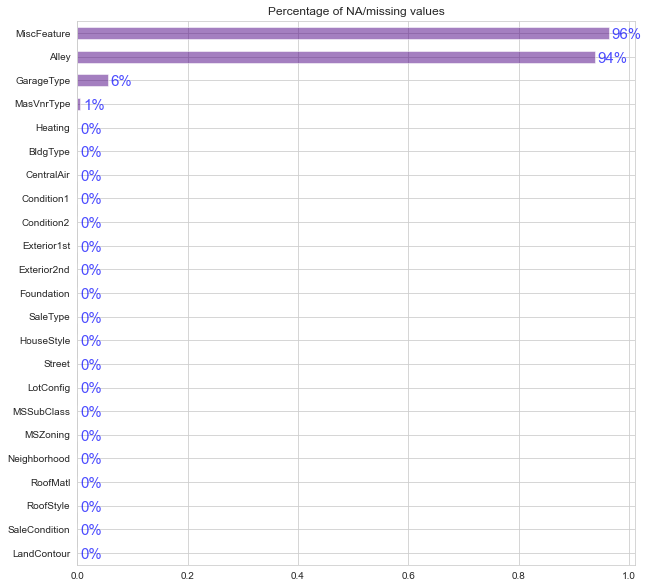

In [44]:
ax = df[nominal_columns].isna().sum().transform(lambda x:x/df[nominal_columns].shape[0]).sort_values().plot.barh(
    figsize=(10,10), title='Percentage of NA/missing values', color='indigo', alpha=0.5)
for i in ax.patches:
    ax.text(i.get_width()+0.005, i.get_y(), str(int(round(i.get_width(),2)*100))+'%', fontsize=15, color='b', alpha=0.7);

In [23]:
for column in NOMINAL_COLUMNS:
    mask = df[column].notnull()
    num_realizations = len(list(x for x in df.loc[mask, column].unique()))
    if column not in ("Neighborhood"):
        assert num_realizations < 18
    assert num_realizations > 1

In [24]:
# display_columns(nominal_columns).head()

In [25]:
# display_columns(nominal_columns)[:5].info()

=============================================================================================
<h4>Ordinal Columns and their full description</h4>
<pre>
BsmtCond       Evaluates the general condition of the basement
BsmtExposure   Refers to walkout or garden level walls
BsmtQual       Evaluates the height of the basement
BsmtFinType1  Rating of basement finished area
BsmtFinType2  Rating of basement finished area (if multiple types)
Electrical      Electrical system
ExterCond      Evaluates the present condition of the material on the exterior
ExterQual      Evaluates the quality of the material on the exterior
Fence           Fence quality
FireplaceQu    Fireplace quality
Functional      Home functionality (Assume typical unless deductions are warranted)
GarageCond     Garage condition
GarageFinish   Interior finish of the garage
GarageQual     Garage quality
HeatingQC      Heating quality and condition
KitchenQual    Kitchen quality
LandSlope      Slope of property
LotShape       General shape of property
OverallCond    Rates the overall condition of the house
OverallQual    Rates the overall material and finish of the house
PavedDrive     Paved driveway
PoolQC         Pool quality
Utilities       Type of utilities available
</pre>

The ordinal columns come with anywhere between 2 and 11 distinct labels each.

In [49]:
ORDINAL_COLUMNS = ["BsmtCond","BsmtExposure","BsmtQual","BsmtFinType1","BsmtFinType2","Electrical", "ExterCond","ExterQual","Fence","FireplaceQu","Functional","GarageCond","GarageFinish","GarageQual","HeatingQC","KitchenQual", "LandSlope","LotShape","OverallCond","OverallQual","PavedDrive","PoolQC","Utilities"]
ordinal_columns = ORDINAL_COLUMNS

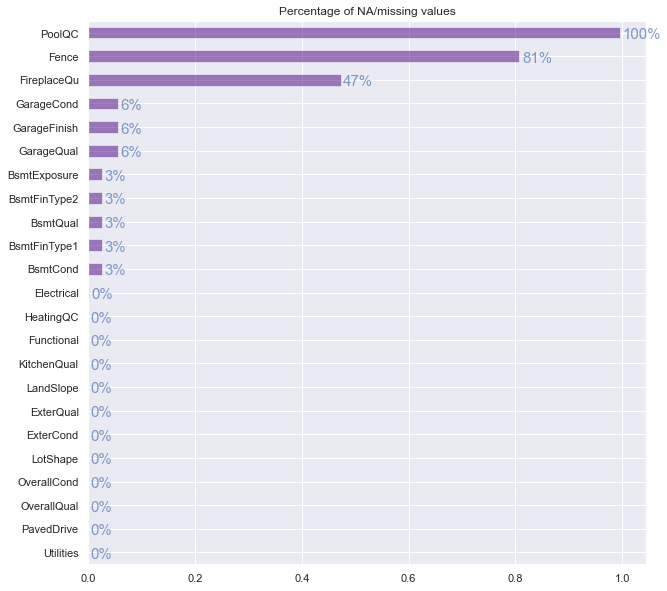

In [50]:
ax = df[ordinal_columns].isna().sum().transform(lambda x:x/df[ordinal_columns].shape[0]).sort_values().plot.barh(
    figsize=(10,10), title='Percentage of NA/missing values', color='indigo', alpha=0.5)
for i in ax.patches:
    ax.text(i.get_width()+0.005, i.get_y(), str(int(round(i.get_width(),2)*100))+'%', fontsize=15, color='b', alpha=0.7);

In [29]:
# display_columns(ordinal_columns).head()

In [30]:
# df[ordinal_columns].info()

=============================================================================================

In [31]:
# The number of numeric columns before making some type columns numerical...
len(df._get_numeric_data().columns)

38

In [32]:
# Columns 'Central_Air' is nicely binary...
df['CentralAir'].value_counts()

Y    1365
N      95
Name: CentralAir, dtype: int64

In [33]:
# Converting the values to 1 and 0 i.e 1 == "Y" and 0 == "N"
# df.CentralAir = df.CentralAir.map(lambda val: int(1) if val == 'Y' else int(0))

In [34]:
df.HeatingQC.value_counts()

Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64

In [35]:
df.BsmtExposure.value_counts()

No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

In [36]:
# Replace all quality designators in df with numbers

# {
#     'LwQ':int(6),
#     'GLQ':int(4),
#     'Ex': int(5),
#     'BLQ':int(5),
#     'Gd': int(4),
#     'TA': int(3),
#     'Av': int(3),
#     'ALQ':int(3),
#     'Fa': int(2),
#     'Mn': int(2),
#     'Rec':int(2),
#     'Po': int(1),
#     'Unf':int(1),
#     'No': int(1),
#     'Na': int(0),
#     "nan": int(0)
# }


#  Ex   Excellent
#  Gd   Good
#  TA   Typical/Average
#  Fa   Fair
#  Po   Poor


temp = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5,'Mn': 2, 'Av': 3,'No': 1,\
             'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6,'RFn': 4, 'Fin': 6,\
             'Sal': 0, 'Sev': 1, 'Maj2': 2, 'Maj1': 3, 'Mod': 4, 'Min2': 5, 'Min1': 6, 'Typ': 7,\
             'MnWw': 1, 'GdWo': 2, 'MnPrv': 3, 'GdPrv': 4,'Sev': 0, 'Mod': 1, 'Gtl': 2,'Y':1,'N':0,\
             'Reg':3, 'IR1':2, 'IR2':1, 'IR3':0,
'SBrkr':0, 'FuseA':1, 'FuseF':2, 'FuseP':3, 'Mix':4,
'Y': 2, 'P': 1, 'N': 0,
'AllPub':1, 'NoSeWa':0}

df.replace(inplace=True, to_replace=temp)

In [37]:
df['Electrical'].unique()

array([ 0.,  2.,  1.,  3.,  4., nan])

In [38]:
df.Functional.value_counts()

7    1360
5      34
6      31
1      15
3      14
2       5
0       1
Name: Functional, dtype: int64

In [700]:
df["Utilities"].unique()

array([1, 0])

In [701]:
# columns as floats or integers respectively.
for column in CONTINOUS_COLUMNS: 
    df[column] = df[column].astype(np.float64)
for column in DISCRETE_COLUMNS:
    df[column] = df[column].fillna(0)
    df[column] = df[column].astype(np.int64)

### Numeric columns

### create dummy variables in df for columns = 'Lot_Config' and 'Neighborhood'

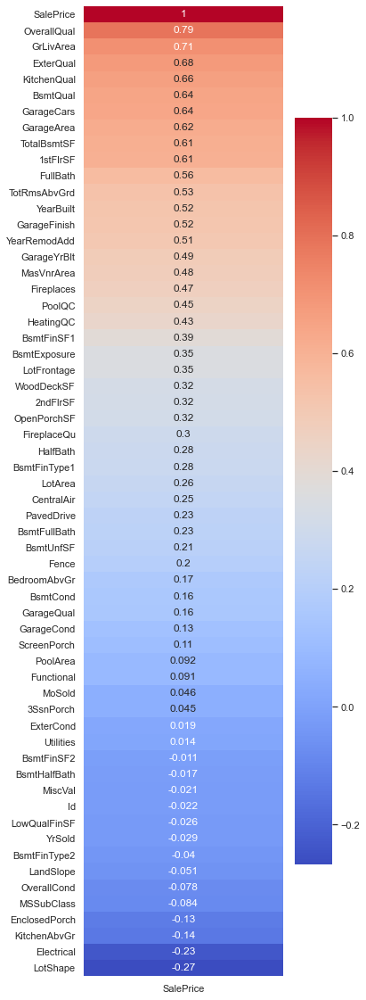

In [45]:
plt.figure(figsize=(5,20))
sns.set(font_scale=1)
sns.heatmap(df.corr()[['SalePrice']].sort_values('SalePrice', ascending=False), annot=True, cmap='coolwarm');

In [51]:
def plot_correlation(data, title):
    """Visualize a correlation matrix in a nice heatmap."""
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_title(title, fontsize=24)
    # Blank out the upper triangular part of the matrix.
    mask = np.zeros_like(data, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    # Use a diverging color map.
    cmap = sns.diverging_palette(240, 0, as_cmap=True)
    # Adjust the labels' font size.
    labels = data.columns
    ax.set_xticklabels(labels, fontsize=10)
    ax.set_yticklabels(labels, fontsize=10)
    # Plot it.
    sns.heatmap(
        data, vmin=-1, vmax=1, cmap='coolwarm', center=0, linewidths=.5,
        cbar_kws={"shrink": .5}, square=True, mask=mask, ax=ax
    )

In [52]:
if "SalePrice" in continous_columns:
    continous_columns = set(continous_columns)
    columns = list(continous_columns)
    columns = sorted(columns)
    pearson = df[columns].corr(method="pearson")
else:
    continous_columns = set(continous_columns)
    columns = list(continous_columns)
    columns.extend(TARGET_VARIABLE)
    pearson = df[columns].corr(method="pearson")
# print(pearson)

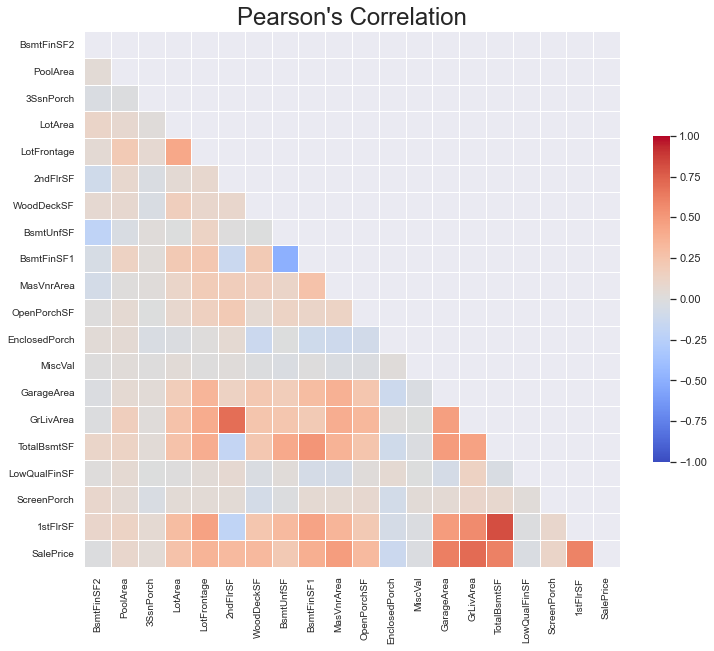

In [53]:
plot_correlation(pearson, "Pearson's Correlation")

Spearman
Spearman's correlation coefficient shows an ordinal rank relationship between two variables.

In [58]:
if "SalePrice" in ordinal_columns:
    ordinal_columns = set(ordinal_columns)
    columns = list(ordinal_columns)
    columns = sorted(columns)
    spearman = df[columns].corr(method="spearman")
else:
    ordinal_columnss = set(ordinal_columns)
    columns = list(ordinal_columns)
    columns.extend(TARGET_VARIABLE)
    spearman = df[columns].corr(method="spearman")
# print(spearman)

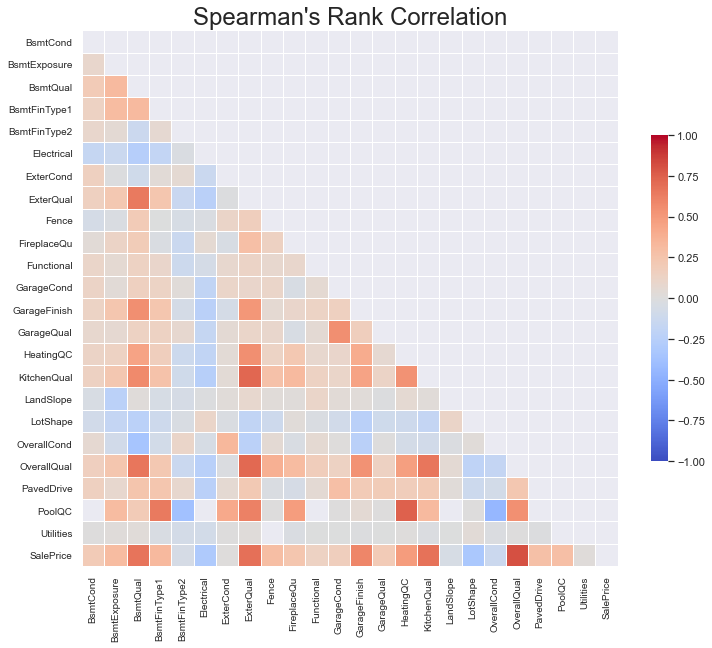

In [59]:
plot_correlation(spearman, "Spearman's Rank Correlation")

From the above visualization using the spearman correlaton plot the field that best describe the SalePrice is the OverallQual i.e the overall material and finish of the house.

# Descriptive Visualizations

The "main" plot used in this afterwards is <b>GrLivArea vs SalePrice</b> as the overall living area is the most correlated predictor (which is also very intuitive). Many of the nominal variables change the slopes of the regression lines for sub-groups of data points significantly.

In [60]:
new_variables = []

## Derived Characteristics
Certain characteristics of a house are assumed to have a "binary" influence on the sales price. For example, the existence of a pool could be an important predictor while the exact size of the pool can be deemed not so important.

The below cell creates boolean factor variables out of a set of numeric variables.

In [67]:
derived_variables = {
    "has 2ndFlr": "2ndFlrSF",
    "has Bsmt": "TotalBsmtSF",
    "has Fireplace": "Fireplaces",
    "has Garage": "GarageArea",
    "has Pool": "PoolArea",
    "has Porch": "OpenPorchSF",
}
# Factorize numeric columns.
for factor_column, column in derived_variables.items():
    df[factor_column] = df[column].apply(lambda x: 1 if x > 0 else 0)
derived_variables = list(derived_variables.keys())
new_variables.extend(derived_variables)

In [68]:
df[derived_variables].head()

,has 2ndFlr,has Bsmt,has Fireplace,has Garage,has Pool,has Porch
0,1,1,0,1,0,1
1,0,1,1,1,0,0
2,1,1,1,1,0,1
3,1,1,1,1,0,1
4,1,1,1,1,0,1


2nd Floors
A second floor may have a positive effect on the sales price. However, having a second floor correlates with overall living space. The individual effect is therefore not as clear as it seems in the plot below.

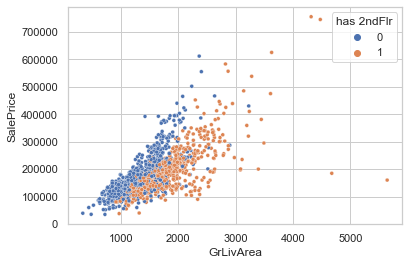

In [527]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="has 2ndFlr", s=15, data=df);

### Basements

Nearly all houses have a basement. Therefore, <b>has Bsmt</b> is most likely not an important predictor.

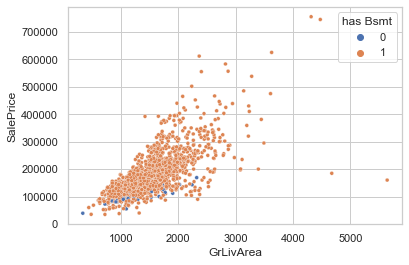

In [528]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="has Bsmt", s=15, data=df);

### Fireplaces

Bigger houses are more likely to have a fireplace. Thus, the variable <b>has Fireplace</b> might be an interesting predictor.

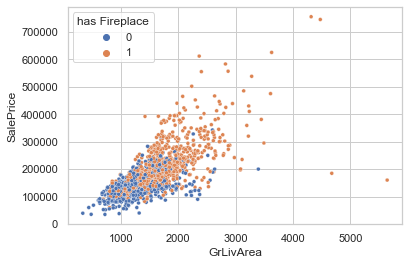

In [529]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="has Fireplace", s=15, data=df);

### Garages

Holding the overall living area fixed adding a garage seems to affect the price positively. Thus, <b>has Garage</b> seems like an interesting predictor as well.

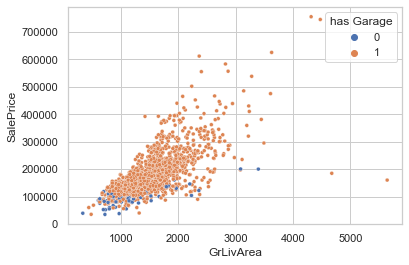

In [530]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="has Garage", s=15, data=df);

### Pools

Unfortunately, from other visualization almost no one has a pool. The predictor <b> has Pool </b> seems quite uninteresting.

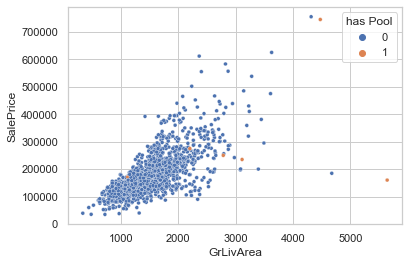

In [532]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="has Pool", s=15, data=df);

### Porch

Most houses have a porch.

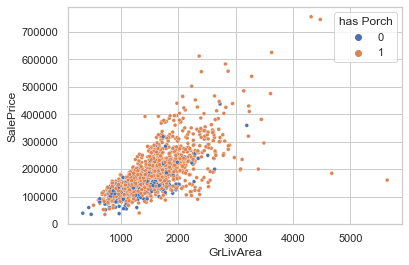

In [533]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="has Porch", s=15, data=df);

## Neighborhoods
Indeed, plotting the price distributions by neighborhood reveals significant differences in the price level.

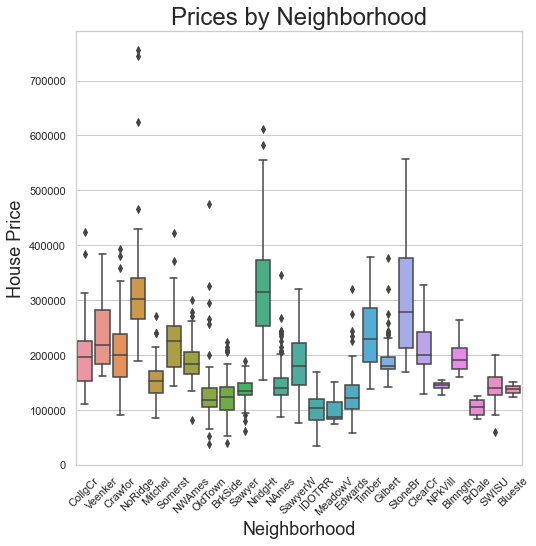

In [538]:
_, ax = plt.subplots(figsize=(8, 8))
sns.boxplot(x="Neighborhood", y="SalePrice", data=df, ax=ax)
ax.set_title("Prices by Neighborhood", fontsize=24)
ax.set_xlabel("Neighborhood", fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_ylabel("House Price", fontsize=18);

The 28 neighborhoods are encoded as factor variables.

In [539]:
neighborhood = pd.get_dummies(df["Neighborhood"], prefix="nhood")
df = pd.concat([df, neighborhood], axis=1)
del df["Neighborhood"]
new_variables.extend(neighborhood.columns)

In [542]:
df[neighborhood.columns].head()

,nhood_Blmngtn,nhood_Blueste,nhood_BrDale,nhood_BrkSide,nhood_ClearCr,nhood_CollgCr,nhood_Crawfor,nhood_Edwards,nhood_Gilbert,nhood_IDOTRR,nhood_MeadowV,nhood_Mitchel,nhood_NAmes,nhood_NPkVill,nhood_NWAmes,nhood_NoRidge,nhood_NridgHt,nhood_OldTown,nhood_SWISU,nhood_Sawyer,nhood_SawyerW,nhood_Somerst,nhood_StoneBr,nhood_Timber,nhood_Veenker
0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


## Nominal Features
This section investigates the rest of the nominal variables with regard to which realizations / encoding might be a useful predictor.

<h4>Nominal Columns and their full description</h4>
<pre>
Alley =======> Type of alley access to property
BldgType =======> Type of dwelling
CentralAir =======> Central air conditioning
Condition1 =======> Proximity to various conditions
Condition2 =======> Proximity to various conditions (if more than one is present)
Exterior1st =======> Exterior covering on house
Exterior2nd  =======>  Exterior covering on house (if more than one material)
Foundation =======> Type of foundation
GarageType =======> Garage location
Heating =======> Type of heating
HouseStyle =======> Style of dwelling
LandContour =======> Flatness of the property
LotConfig =======> Lot configuration
MSSubClass =======> Identifies the type of dwelling involved in the sale.
MSZoning =======> Identifies the general zoning classification of the sale.
MasVnrType =======> Masonry veneer type
MiscFeature =======> Miscellaneous feature not covered in other categories
Neighborhood =======> Physical locations within Ames city limits (map available)
RoofMatl =======> Roof material
RoofStyle =======> Type of roof
SaleCondition =======> Condition of sale
SaleType =======> Type of sale
Street =======> Type of road access to property
</pre>

In [545]:
df["Alley"].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

### Alleys

Almost no house has access to an alley.

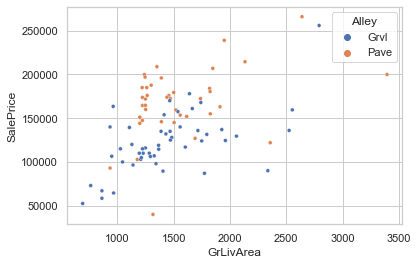

In [552]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="Alley", s=15, data=df);

In [553]:
del df["Alley"]

### Building Type

The type of a building clearly affects the valuation. The two types of townhouses as well as the 2-family condo and duplex type are summarized into a single category. This makes sense a) semantically, and b) by looking at the two sub-clusters in the scatter plot.

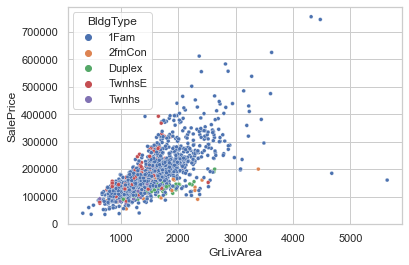

In [555]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="BldgType", s=15, data=df);

In [556]:
# Unify the two townhouse types into one.
df["BldgType"] = df["BldgType"].apply(
    lambda x: "Twnhs" if x in ("TwnhsE", "TwnhsI") else x
)
# Unify the two kinds of 2-family homes.
df["BldgType"] = df["BldgType"].apply(
    lambda x: "2Fam" if x in ("2FmCon", "Duplx") else x
)

In [557]:
build_type = pd.get_dummies(df["BldgType"], prefix="build_type")
df = pd.concat([df, build_type], axis=1)
del df["BldgType"]

In [558]:
new_variables.extend(build_type.columns)

### Air Conditioning

Air conditioning clearly increases the valuation ("steeper" regression line with respect to the overall living area).

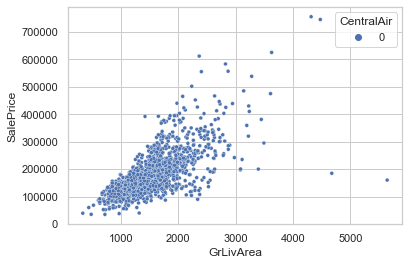

In [576]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="CentralAir", s=15, data=df);

In [69]:
# df["air_cond"] = df["Central Air"].apply(lambda x: 1 if x == "Y" else 0).astype(int)
# del df["Central Air"]

In [579]:
new_variables.append("air_cond")

In [ ]:
df[["air_cond"]].head()

### Exterior

This dimensions tells the main material with which the houses are made of. The category is too diverse and the various grouped scatter plots did not reveal differing slopes. For simplicity, this variable is dropped.

This variable actually also represents tags that could be associated with a house (possibly up to two different tags).

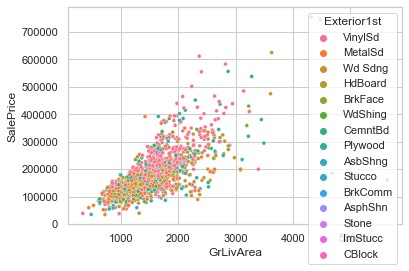

In [584]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="Exterior1st", s=15, data=df);

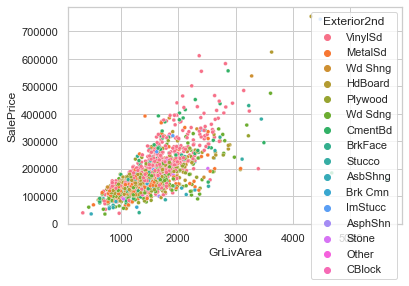

In [586]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="Exterior2nd", s=15, data=df);

In [588]:
del df["Exterior1st"]
del df["Exterior2nd"]
# Also discard the associated ordinal variables.
del df["ExterCond"]
del df["ExterQual"]

### Foundation

The type of foundation appears to have an effect. However, only three of the six realizations occur in a large number. Factor variables *found_BrkTil*, *found_CBlock*, and *found_PConc* are extracted but not regarded as "interesting".

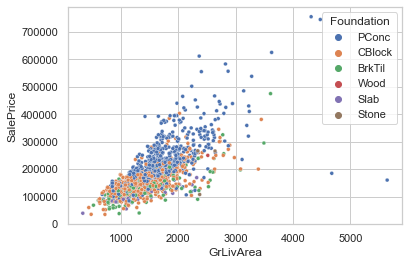

In [590]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="Foundation", s=15, data=df);

In [591]:
df["Foundation"].value_counts()

PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64

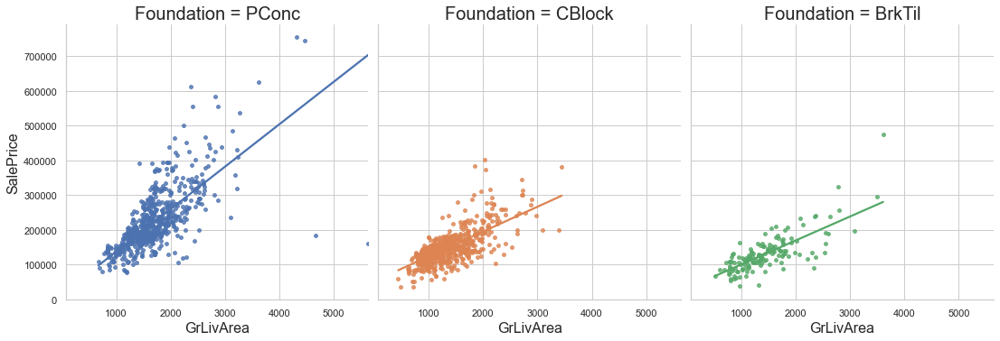

In [592]:
plot = sns.lmplot(
    x="GrLivArea", y="SalePrice", col="Foundation", hue="Foundation",
    col_order=["PConc", "CBlock", "BrkTil"],
    data=df, robust=True, col_wrap=4, ci=None, truncate=True, scatter_kws={"s": 15},
)
# Adjust font sizes.
for ax in plot.axes:
    ax.set_title(ax.get_title(), fontsize=20)
    ax.set_xlabel(ax.get_xlabel(), fontsize=16)
    ax.set_ylabel(ax.get_ylabel(), fontsize=16)

In [593]:
foundation = pd.get_dummies(df["Foundation"], prefix="found")
# Only keep the top 3 realizations.
del foundation["found_Slab"]
del foundation["found_Stone"]
del foundation["found_Wood"]
df = pd.concat([df, foundation], axis=1)
del df["Foundation"]

In [594]:
new_variables.extend(["found_BrkTil", "found_CBlock", "found_PConc"])

### Garage Type

As can be expected, the *Garage Type* looks very similar to the above *has Garage* variable. Therefore, it is dropped.

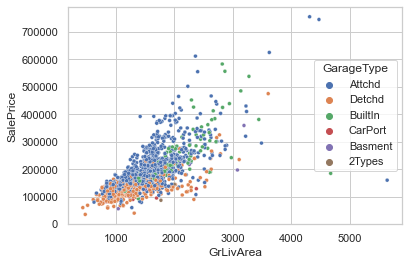

In [596]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="GarageType", s=15, data=df);

### Heating

Most of the houses have gas. The variable is not helpful.

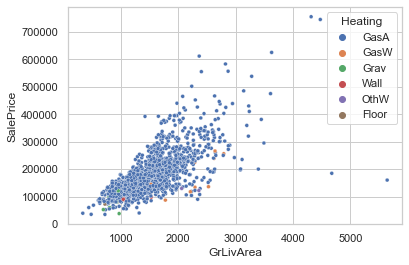

In [598]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="Heating", s=15, data=df);

In [71]:
del df["Heating"]
# # Also discard the associated ordinal variable.
del df["HeatingQC"]

### House Style

In summary, this variable is very similar to the above derived variable *has 2nd Flr*. Therefore, it is dropped.

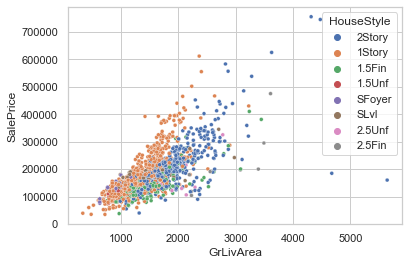

In [603]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="HouseStyle", s=15, data=df);

In [605]:
del df["HouseStyle"]

### Land Contour
This variable is assumed to contain the same information as the ordinal variable Land Slope and is dropped.

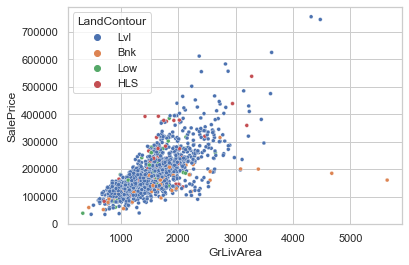

In [607]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="LandContour", s=15, data=df);

In [609]:
del df["LandContour"]

### Lot Configuration

This variable shows no good pattern and is dropped.

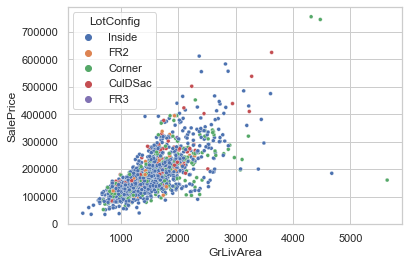

In [611]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="LotConfig", s=15, data=df);

In [613]:
del df["LotConfig"]

### Miscellaneous Features

This variable is basically a "other" field with no pattern.

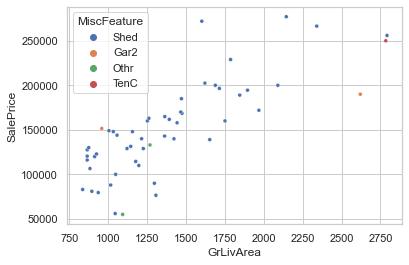

In [615]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="MiscFeature", s=15, data=df);

In [617]:
del df["MiscFeature"]

### Sale Info

Partial and abnormal (= foreclosure) sales seem to make a change with higher and lower prices respectively. These two types will be encoded in factor variables <b>partial_sale</b> and <b>abnormal_sale</b>. The impact seems to be not big though.

In [619]:
df["SaleCondition"].value_counts()

Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: SaleCondition, dtype: int64

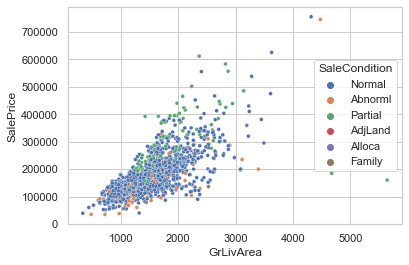

In [621]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="SaleCondition", s=15, data=df);

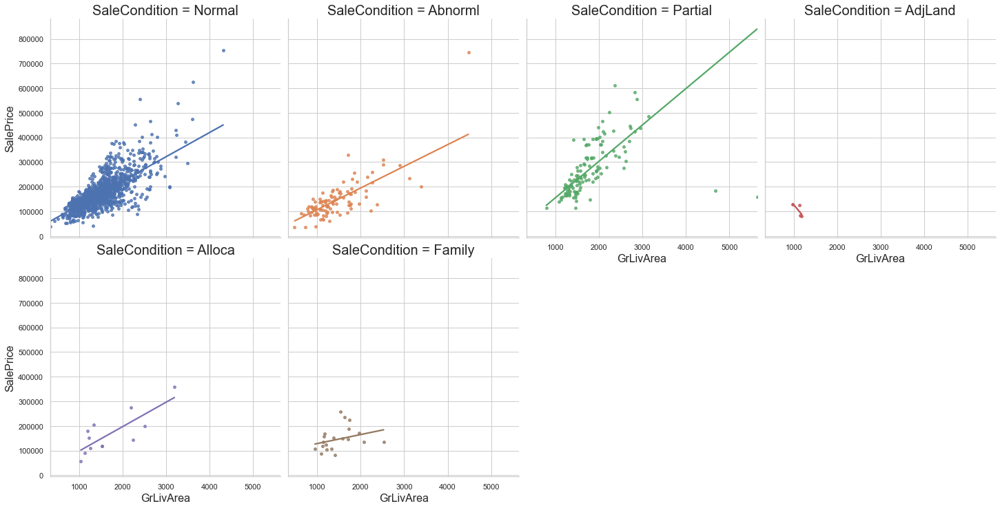

In [622]:
plot = sns.lmplot(
    x="GrLivArea", y="SalePrice", col="SaleCondition", hue="SaleCondition",
    data=df, robust=True, col_wrap=4, ci=None, truncate=True, scatter_kws={"s": 15},
)
# Adjust font sizes.
for ax in plot.axes:
    ax.set_title(ax.get_title(), fontsize=20)
    ax.set_xlabel(ax.get_xlabel(), fontsize=16)
    ax.set_ylabel(ax.get_ylabel(), fontsize=16)

In [623]:
df["partial_sale"] = df["SaleCondition"].apply(lambda x: 1 if x == "Partial" else 0)
df["abnormal_sale"] = df["SaleCondition"].apply(lambda x: 1 if x == "Abnorml" else 0)

Homes that are sold for the first time cleare are priced higher. A factor variable <b>new_home</b> is introduced.

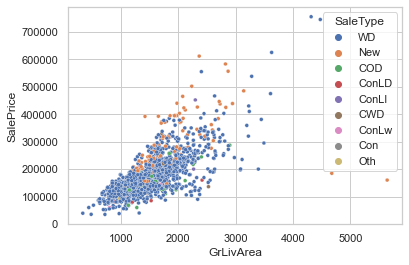

In [625]:
sns.scatterplot(x="GrLivArea", y="SalePrice", hue="SaleType", s=15, data=df);

In [628]:
df["new_home"] = df["SaleType"].apply(lambda x: 1 if x == "New" else 0)

In [629]:
new_variables.extend(["partial_sale", "abnormal_sale", "new_home"])

In [631]:
del df["SaleType"]

Show summary of counts:

In [632]:
df[["partial_sale", "abnormal_sale", "new_home"]].sum()

partial_sale     125
abnormal_sale    101
new_home         122
dtype: int64

In [16]:
from collections import defaultdict

In [ ]:
d = defaultdict(LabelEncoder)
x = x.apply(lambda x: d[x.name].fit_transform(x))